# Obtaining Strain rates (season-scale) for station A11

First, we need to have the proper profiles. We use the steps for obtaining profiles detailed in our chirp processing documents. 

## Setup

In [1]:
# Load libraries
import sys
import sys
sys.path.append("../../../xapres_package/")
import ApRESDefs
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker 
import pickle

import xarray as xr
import importlib
import pandas as pd
import math
from datetime import datetime, timedelta, date
from scipy.stats import linregress
from helpers import *

importlib.reload(ApRESDefs)
xa = ApRESDefs.xapres(loglevel='debug')

DEBUG    13:46:08 	 ApRESDefs.py @function _setup_logging line 615 - Stream logging level set to DEBUG
DEBUG    13:46:08 	 ApRESDefs.py @function _setup_logging line 616 - Add console handler to logger
DEBUG    13:46:08 	 ApRESDefs.py @function _setup_logging line 629 - File logging level set to DEBUG


In [2]:
# Load data
with open('../chirp_processing/A11_22S.pickle', 'rb') as handle:
    s22 = pickle.load(handle)

with open('../chirp_processing/A11_22W.pickle', 'rb') as handle:
    winter = pickle.load(handle)
    
#ds_101 = reload("A101")
#ds_101 = ds_101.isel(time=range(20,len(ds_101.time))) # trim first few bursts, which were tests

#ds_101_w = reload_winter("A101")

#ds_101_s = reload_summer("A101")


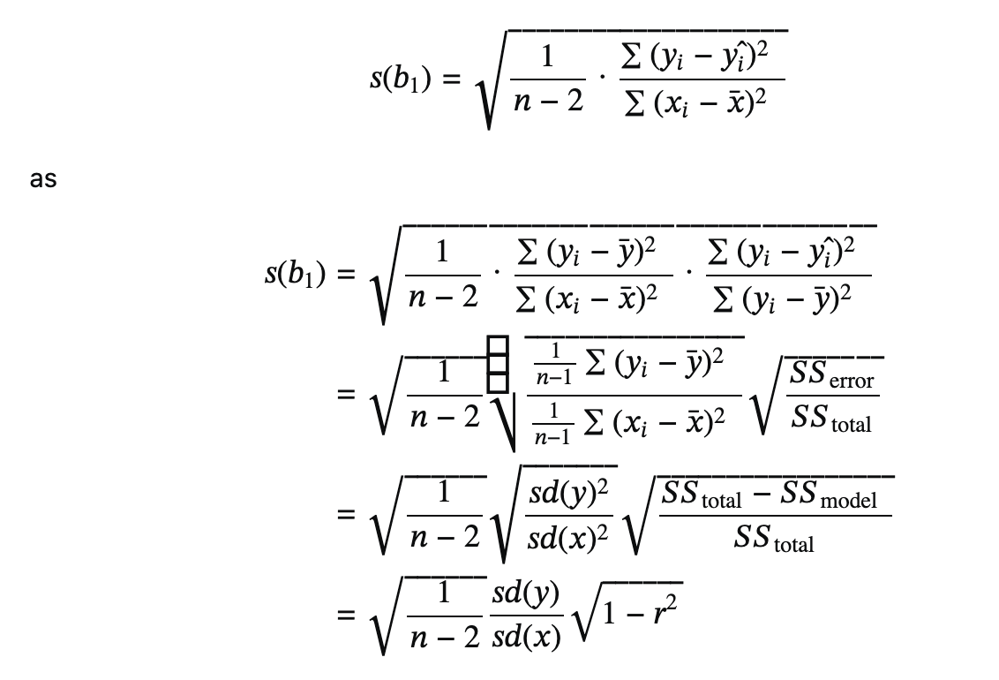

In [95]:
def strain_metrics(ds, win_cor, step, lag, noise_floor):
    # This function, given a window, and step, gives a total percentage of data that has high coherence
    b1 = ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    dz, co, phi = xa.generate_range_diff(b1,b2,win_cor,step,None,0,0.95)
    dz=dz.assign(coherence=(['time','profile_range'],co))
    dz_new = dz.where(abs(dz.coherence) > 0.95).drop_duplicates('time')

    vv = dz_new.range_diff / dz_new.time_diff * 31536000
    vv_err = dz_new.err / dz_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=noise_floor).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv.where(vv.profile_range <=noise_floor)-vv.where(vv.profile_range <=noise_floor).mean())**2).sum(dim='profile_range')
    return np.count_nonzero(abs(co)>0.95)/np.count_nonzero(co),np.mean(r2).values,[vv,vv_err,fit,r2]

def optimal_window_and_leapfrog(ds,noise_floor):
    max_score = 0
    windows = np.arange(20,90,20)
    lags = np.round(np.logspace(0,3,4)).astype('int')
    co_mat = np.zeros((len(windows),len(lags)))
    r2_mat = np.zeros((len(windows),len(lags)))
    for i in range(len(windows)):
        step = windows[i] # earlier experiments show step doesn't change results by much
        #for step in [10,20,40,80]:
        #    if step <= window:
        for j in range(len(lags)):
            count,r2,res = strain_metrics(ds, windows[i], step,lags[j],noise_floor)
            print(f"Window {windows[i]}, lag {lags[j]} -> frac high co {count:.2}, r2 {r2:.2}")
            co_mat[i,j] = count
            r2_mat[i,j]=r2
            # mean coherence not relevant I think
            temp_score = count+r2
            if temp_score > max_score:
                max_score = temp_score
                to_return = windows[i],lags[j],res
            
    fig, axs = plt.subplots(ncols=2,figsize=(15,5))
    plt0 = axs[0].pcolormesh(100*co_mat)
    plt.colorbar(plt0,ax=axs[0],label='fraction of data with |coherence|>0.95')
    axs[0].set_xticks(np.arange(co_mat.shape[1]) + 0.5, minor=False)
    axs[0].set_yticks(np.arange(co_mat.shape[0]) + 0.5, minor=False)
    axs[0].set_xticklabels(lags)
    axs[0].set_yticklabels(windows)
    axs[0].set_ylabel('Correlation window size [points included]')
    axs[0].set_xlabel('Lag between bursts [num. bursts seperated]')
    axs[0].set_title('fraction of data with high coherence')

    plt1 = axs[1].pcolormesh(r2_mat)
    plt.colorbar(plt1,ax=axs[1],label='Average r^2 of linear strain fits')
    axs[1].set_xticks(np.arange(r2_mat.shape[1]) + 0.5, minor=False)
    axs[1].set_yticks(np.arange(r2_mat.shape[0]) + 0.5, minor=False)
    axs[1].set_xticklabels(lags)
    axs[1].set_yticklabels(windows)
    axs[1].set_ylabel('Correlation window size [points included]')
    axs[1].set_xlabel('Lag between bursts [num. bursts seperated]')
    axs[1].set_title('Mean strain rate fit r-squared')

    return to_return
    
def plot_strain_fit(res,xlims=None,ylims=None):
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    fig, axs = plt.subplots(nrows=2,figsize=(10,6),sharex=True)
    axs[0].plot(fit.time.values,fit.polyfit_coefficients.sel(degree=1).values,linestyle='None',marker='.')
    if ylims:
        axs[0].set_ylim(ylims)
    axs[0].set_ylabel('Strain rate [y$^{-1}$]')
    axs[0].set_title('Strain fitting results')
    axs[1].plot(fit.time.values,r2.values,linestyle='None',marker='.')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('r$^2$')
    
    fig1, axs_1 = plt.subplots(ncols=10,figsize=(19,5),sharey=True,layout='constrained')
    #fig1.suptitle('Strain fitting (\u03B5\u0307 in 10$^{-3}$ yr$^{-1}$)',fontsize=18)
    vv_times = np.arange(math.ceil(0.05*len(vv.time)),len(vv.time),len(vv.time)//10)
    for i in range(10):
        time = vv.time.isel(time = vv_times[i]).values
        axs_1[i].errorbar(vv.sel(time = time,method="nearest") ,vv.profile_range,yerr=None,xerr=vv_err.sel(time = time,method="nearest"),marker='.',linestyle='None',zorder=1)
        slope = fit.polyfit_coefficients.sel(degree=1).isel(time=vv_times[i]).values*np.linspace(20,600)+fit.polyfit_coefficients.sel(degree=0).isel(time=vv_times[i]).values

        axs_1[i].plot(slope,np.linspace(20,600),color='r',zorder=2)
        unit = ''#'x10$^{-3}$ yr$^{-1}$'
        #axs_1[plt_count].text(-10,300, f"\u03B5\u0307= {fit.polyfit_coefficients.sel(degree=1).isel(time=i).values*1000:.2g}"+unit,color = 'r',fontsize=14)
        axs_1[i].set_title(f'{time.astype(str)[:10]}')
        if xlims:
            axs_1[i].set_xlim(xlims)
        axs_1[i].set_ylim([20,1400])
        axs_1[i].tick_params(axis='both', which='major', labelsize=14)


    axs_1[0].invert_yaxis()

    axs_1[0].set_ylabel('depth [m]',fontsize=18)
    fig1.supxlabel('vertical velocity [m y$^{-1}$]',fontsize=18)

def plot_vv_2d(res,xlims=None):
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    fig, axs = plt.subplots(figsize=(20,10),nrows=2,sharex=True)
    plt1 = vv.plot(ax=axs[0],x='time',cmap='RdBu',vmin=-10,vmax=10)
    axs[0].invert_yaxis()
    axs[0].set_title('Vertical velocity estimate')
    axs[0].set_xlabel('')
    plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

    plt2 = vv_err.plot(ax=axs[1],x='time',cmap='Blues')
    axs[1].invert_yaxis()
    axs[1].set_xlabel('Date')
    axs[1].set_title('Vertical velocity error')
    if xlims:
        plt.xlim(xlims)
    plt2.colorbar.set_label(label='vertical velocity error [m y$^{-1}$]', size=14)





## Summer 2022
First, load profiles

In [4]:
#s22 = custom_profile(ds_101.isel(attenuator_setting_pair=0).chirp,clip_threshold=1.2,min_chirps = 5,start=20000)

In [5]:
s22.nbytes/1e9

0.623348592

In [6]:
s22.profile_range

<xarray.DataArray 'profile_range' (profile_range: 3329)> Size: 27kB
array([0.000000e+00, 4.206212e-01, 8.412424e-01, ..., 1.398986e+03,
       1.399407e+03, 1.399827e+03])
Coordinates:
  * profile_range  (profile_range) float64 27kB 0.0 0.4206 ... 1.399e+03 1.4e+03

We see right now that the profile resolution is about 42 cm for each layer. Now just to visualize the data, we plot the profile amplitudes.

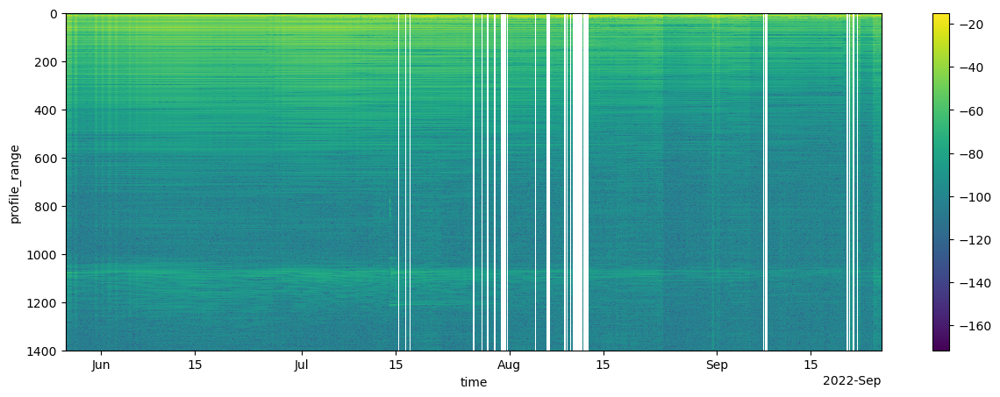

In [7]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(s22).plot(x='time')
ax.invert_yaxis()


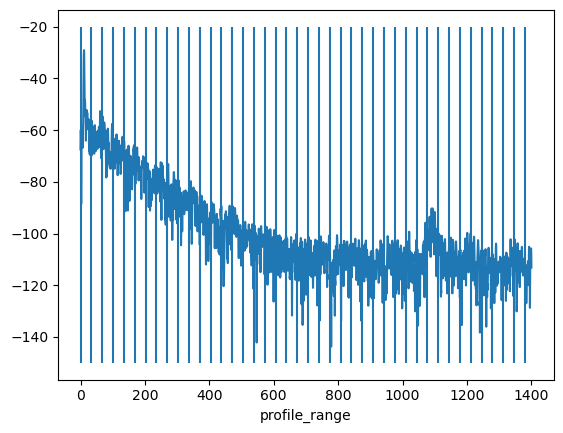

In [20]:
xa.dB(s22.mean(dim='time')).plot()
plt.vlines(s22.profile_range[::80].values,-150,-20)

Already, we reach an important decision in our calculation, notably in defining which burst pairs to compare. Additionally, there are evident gaps and irregular sampling in the profile data, which need to be accounted for.

First, let's identify the different methods to obtain vertical velocities. We settle on vertical velocities as the key variable because they are dependent on the temporal sampling. Next, we will identify the relevant metrics to determine which method is best. 

In terms of the methods, there's two key techniques to get to a vertical velocity timeseries. First is calculating displacements between consecutive bursts, then summing them over a time window to get a larger, more obvious displacement to derive a vertical velocity from. The other method is to directly compare bursts further apart, and to move that window with each timestep to get a rolling calculation. 

To preserve some aspect of temporal resolution, we will use this rolling method. In previous tests, we have found the error associated with this method to be reduced compared to stacking up displacements calculated from consecutive bursts, since those errors propogate to be quite large when summed. 

First, for simplicity, we will use the irregularly sampled data. This will result in velocity estimates at a roughly 15 minute resolution, based on a rough window size, which is specified by the number of bursts in between the burst pair used to calculate the displacement. 

Next, in terms of the metric to determine the best window size, we want to maximize coherence between bursts, but we also want to have a large enough signal. Consequently we will maximize both the mean coherence of the displacements in addition to the smoothness of the resulting displacments over depth. To assess smoothness, we apply a linear fit to the data and calculate an r-squared. We do this with the top 600 m of data, as our profile reaches a noise floor at that depth on average.


In [16]:
1.6823e8 / s22.attrs['centre_freq']

0.4806640094858498

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 1 -> mean 0.98, r2 0.12


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 10 -> mean 0.97, r2 0.41


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 100 -> mean 0.94, r2 0.79


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 1000 -> mean 0.77, r2 0.94


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 1 -> mean 0.98, r2 0.19


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 10 -> mean 0.97, r2 0.53


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 100 -> mean 0.93, r2 0.85


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 1000 -> mean 0.76, r2 0.94


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 1 -> mean 0.98, r2 0.27


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 10 -> mean 0.97, r2 0.61


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 100 -> mean 0.93, r2 0.88


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 1000 -> mean 0.75, r2 0.96


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 1 -> mean 0.98, r2 0.32


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 10 -> mean 0.97, r2 0.66


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 100 -> mean 0.94, r2 0.89


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 1000 -> mean 0.75, r2 0.97
Best window: 80, best lag: 100


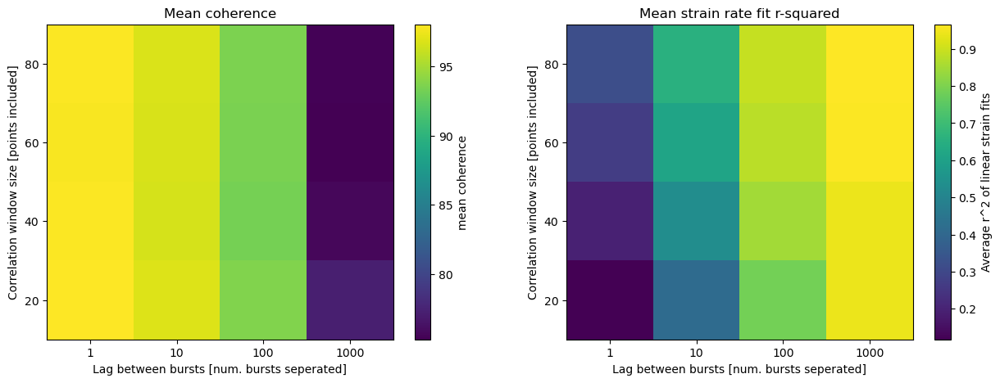

In [7]:
best_window,best_lag,res = optimal_window_and_leapfrog(s22,600)
print(f'Best window: {best_window}, best lag: {best_lag}')

We see that with our irregular gird, comparing bursts roughly 100 measurements apart and with a correlation window size of 80 range points gives the optimal results per our metrics. 

In [7]:
mean,r2,res = strain_metrics(s22, 80, 80,100,600)

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


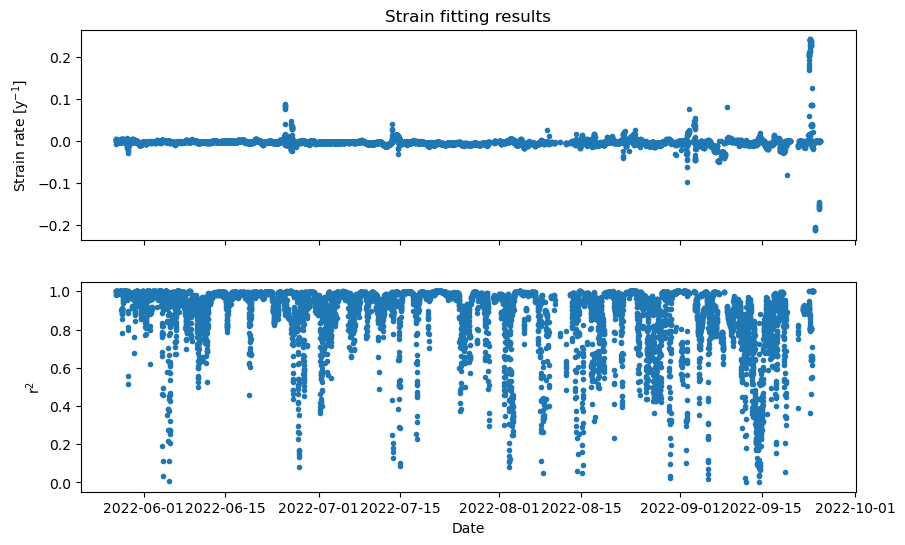

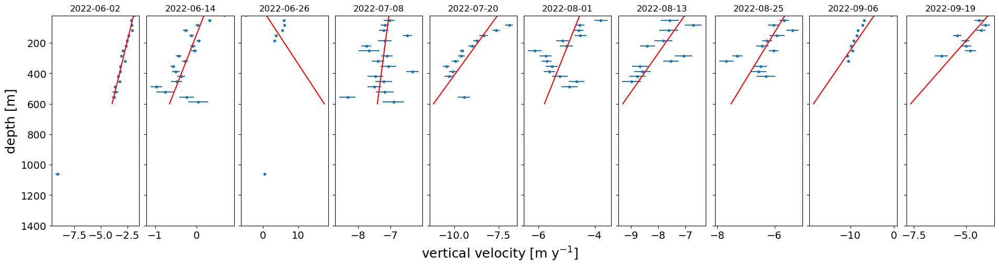

In [8]:
plot_strain_fit(res)

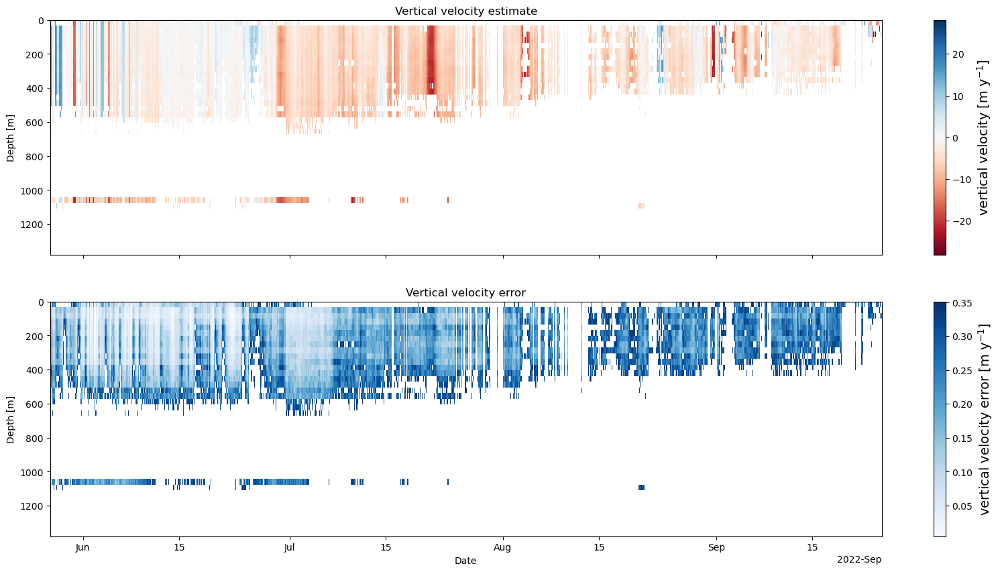

In [9]:
plot_vv_2d(res)

Let's try interpolating

In [10]:
s22

<xarray.DataArray (time: 11703, profile_range: 3329)> Size: 623MB
array([[-4.39846158e-04+0.00000000e+00j,  6.13942156e-04+3.92021821e-04j,
         2.71984378e-04-8.53220960e-04j, ...,
         3.20964257e-06+6.29732413e-06j,  5.82748966e-07-4.18590978e-06j,
        -2.88563170e-06+3.12139336e-06j],
       [-5.12038984e-04+0.00000000e+00j,  5.29405791e-04+4.54778334e-04j,
         3.12447297e-04-7.34555609e-04j, ...,
         4.46861284e-08-3.25369263e-06j, -1.06827920e-05+7.76744507e-07j,
         2.51440840e-06+1.33551250e-05j],
       [-4.60197121e-04+0.00000000e+00j,  4.64904300e-04+4.09354243e-04j,
         2.82691248e-04-6.43754913e-04j, ...,
        -1.53678955e-06+3.80409113e-06j,  2.19454496e-06+3.65662397e-06j,
         6.50654405e-06-1.38807208e-06j],
       ...,
       [ 2.63840203e-03+0.00000000e+00j,  1.75636170e-03-2.31273008e-03j,
        -1.54356544e-03-2.46834418e-03j, ...,
         1.77792249e-05+1.33711636e-05j,  6.77998990e-06-1.55006117e-05j,
        -9.94599832e-06+2.56470951e-06j],
       [ 2.60833999e-03+0.00000000e+00j,  1.73300962e-03-2.28633072e-03j,
        -1.52594567e-03-2.43527276e-03j, ...,
         1.10988728e-05+1.66302905e-05j,  1.32660997e-05-1.19459492e-05j,
        -9.88713866e-06-6.80982278e-06j],
       [ 2.60766549e-03+0.00000000e+00j,  1.70379453e-03-2.28587724e-03j,
        -1.52602605e-03-2.39413669e-03j, ...,
         1.01170728e-05+9.46511877e-06j,  1.05261718e-05-9.73018211e-06j,
        -6.79082990e-06-9.56213901e-06j]])
Coordinates:
  * profile_range  (profile_range) float64 27kB 0.0 0.4206 ... 1.399e+03 1.4e+03
  * time           (time) datetime64[ns] 94kB 2022-05-26T17:06:29 ... 2022-09...
Attributes:
    centre_freq:  349995000.0

In [11]:
time_to_interp = pd.date_range("2022-05-27 12:00", "2022-09-25 12:00", freq="15min")
interp_profiles = s22.interp(time=time_to_interp,method='linear')

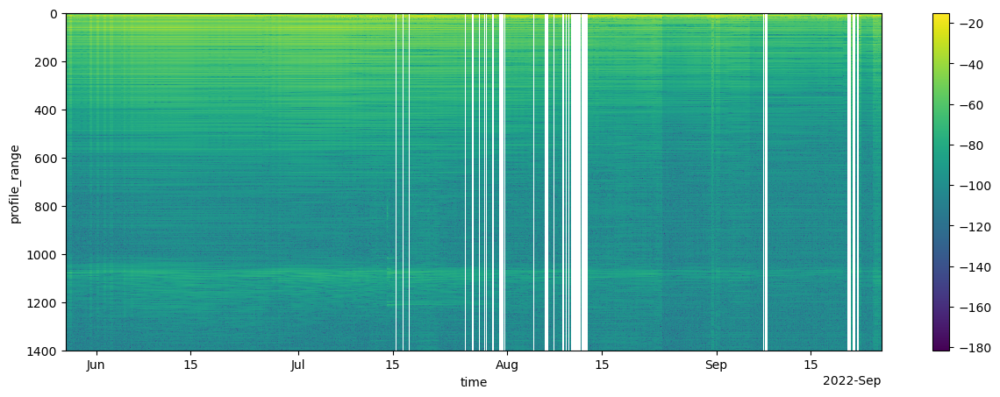

In [12]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(interp_profiles).plot(x='time')
ax.invert_yaxis()


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 1 -> mean 0.99, r2 0.14


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 10 -> mean 0.98, r2 0.43


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 100 -> mean 0.94, r2 0.79


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 1000 -> mean 0.77, r2 0.94


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 1 -> mean 0.99, r2 0.21


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 10 -> mean 0.97, r2 0.55


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 100 -> mean 0.94, r2 0.85


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 1000 -> mean 0.76, r2 0.94


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 1 -> mean 0.99, r2 0.29


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 10 -> mean 0.98, r2 0.63


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 100 -> mean 0.94, r2 0.88


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 1000 -> mean 0.76, r2 0.96


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 1 -> mean 0.99, r2 0.33


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 10 -> mean 0.98, r2 0.67


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 100 -> mean 0.94, r2 0.89


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 1000 -> mean 0.76, r2 0.97
Best window: 80, best lag: 100


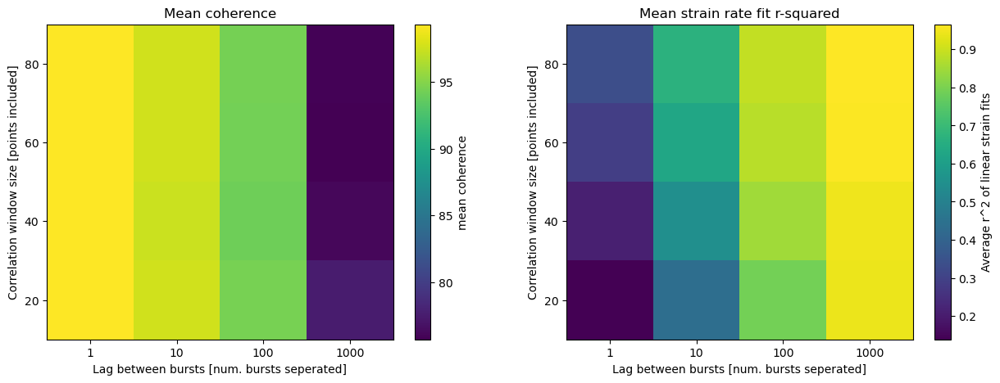

In [13]:
best_window,best_lag,res = optimal_window_and_leapfrog(interp_profiles,600)
print(f'Best window: {best_window}, best lag: {best_lag}')

The warnings are due to the nan values being used in calculations. The optimal window and lag are the same as before.

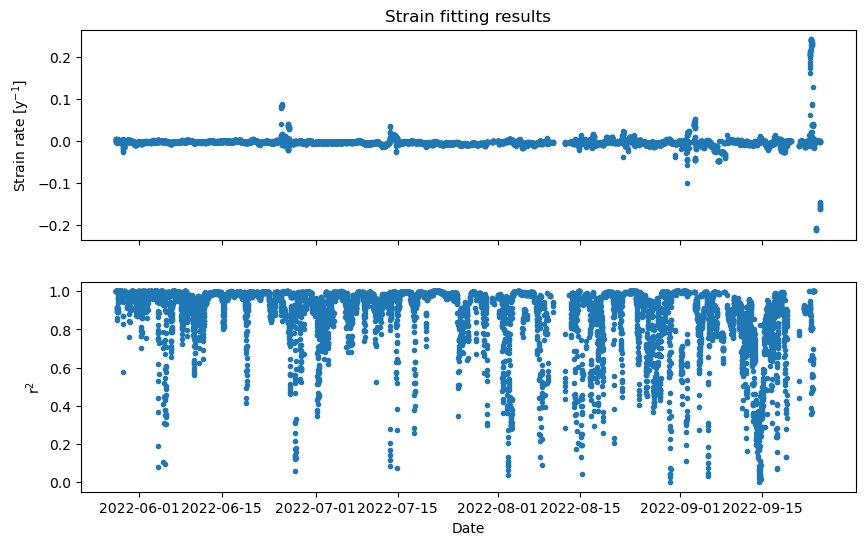

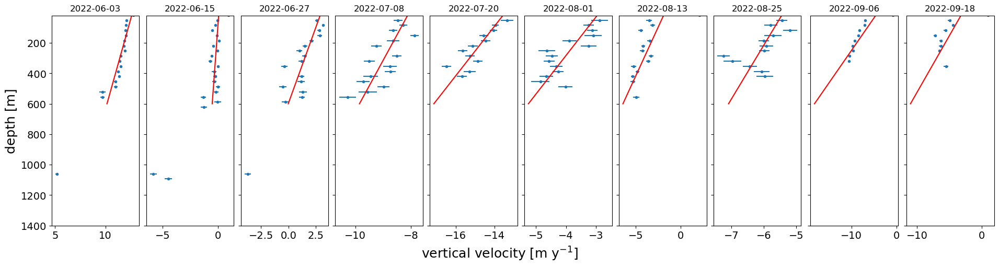

In [14]:
plot_strain_fit(res)

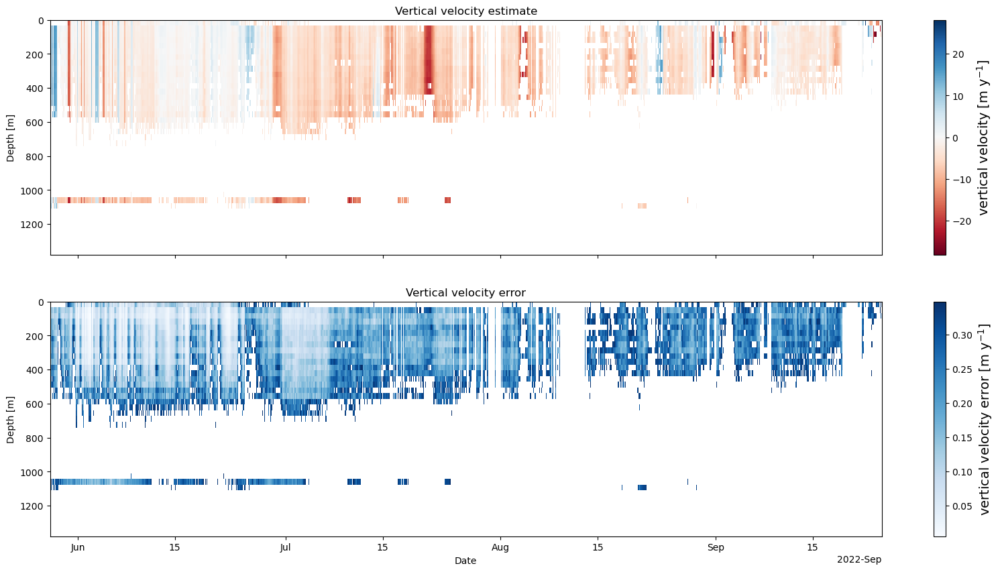

In [15]:
plot_vv_2d(res)

Let's try a different chirp subsection as well.

In [12]:
#s22 = custom_profile(ds_101.isel(attenuator_setting_pair=0).chirp,clip_threshold=1.2,min_chirps = 5,start=28000)

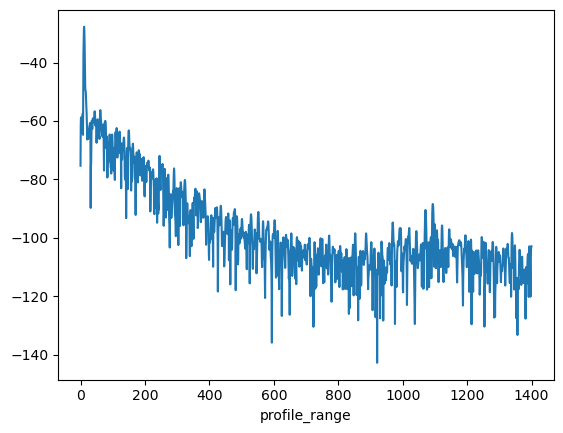

In [17]:
xa.dB(s22.mean(dim='time')).plot()


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 1 -> mean 0.97, r2 0.15


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 10 -> mean 0.96, r2 0.43


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 100 -> mean 0.93, r2 0.76


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 20, lag 1000 -> mean 0.76, r2 0.85


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 1 -> mean 0.97, r2 0.26


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 10 -> mean 0.96, r2 0.58


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 100 -> mean 0.93, r2 0.84


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 40, lag 1000 -> mean 0.74, r2 0.94


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 1 -> mean 0.97, r2 0.35


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 10 -> mean 0.96, r2 0.65


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 100 -> mean 0.93, r2 0.86


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 60, lag 1000 -> mean 0.74, r2 0.96


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 1 -> mean 0.96, r2 0.43


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 10 -> mean 0.95, r2 0.69


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 100 -> mean 0.92, r2 0.88


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Window 80, lag 1000 -> mean 0.72, r2 0.98
Best window: 80, best lag: 100


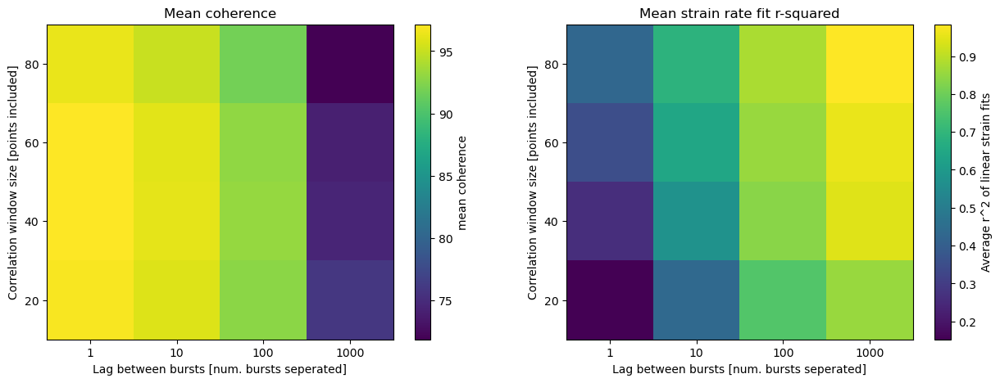

In [18]:
best_window,best_lag,res = optimal_window_and_leapfrog(s22,600)
print(f'Best window: {best_window}, best lag: {best_lag}')

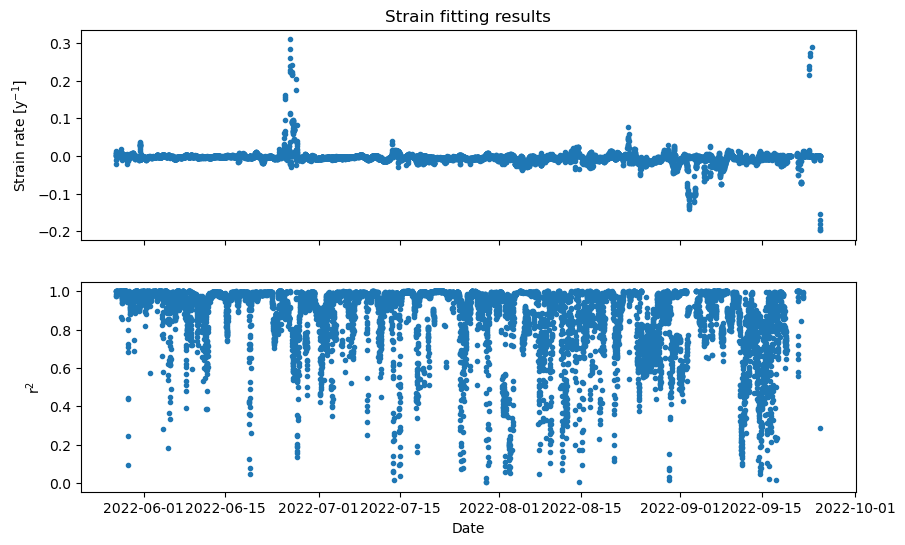

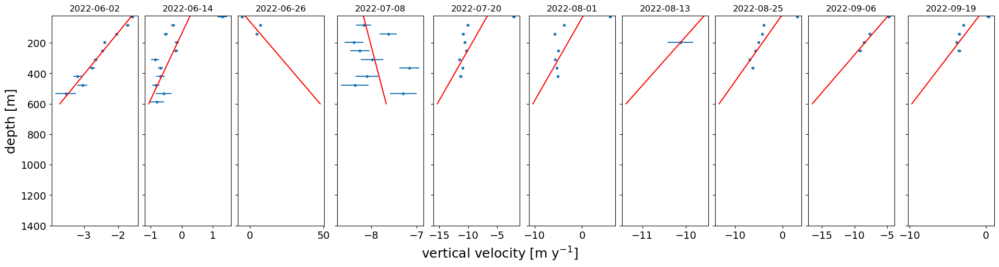

In [19]:
plot_strain_fit(res)

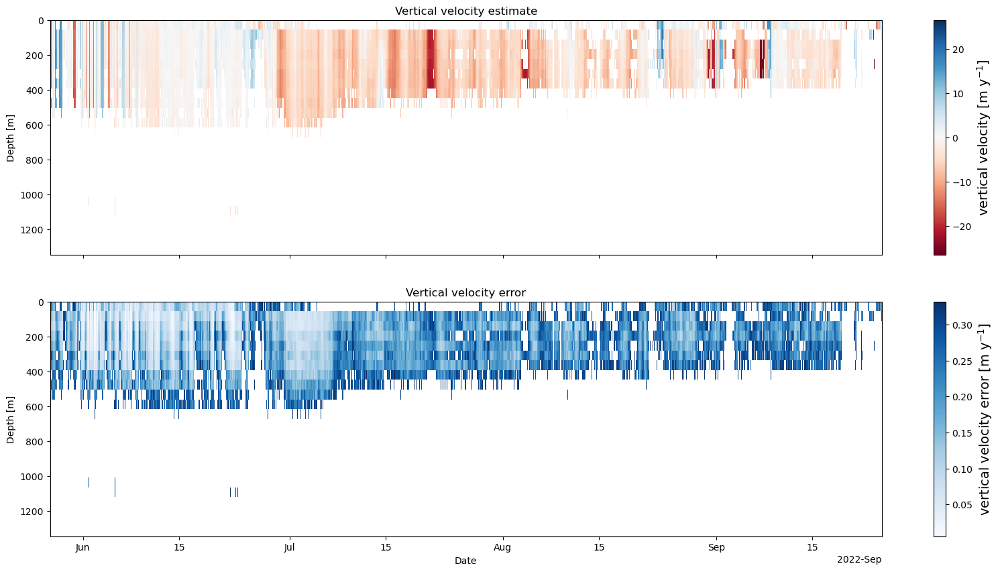

In [20]:
plot_vv_2d(res)

## Winter 

In [13]:
#winter = custom_profile(ds_101_w.isel(attenuator_setting_pair=0).chirp,clip_threshold=1.2,min_chirps = 5,start=200)

In [14]:
winter.profile_range

<xarray.DataArray 'profile_range' (profile_range: 6624)> Size: 53kB
array([0.000000e+00, 2.113569e-01, 4.227138e-01, ..., 1.399394e+03,
       1.399605e+03, 1.399817e+03])
Coordinates:
  * profile_range  (profile_range) float64 53kB 0.0 0.2114 ... 1.4e+03 1.4e+03

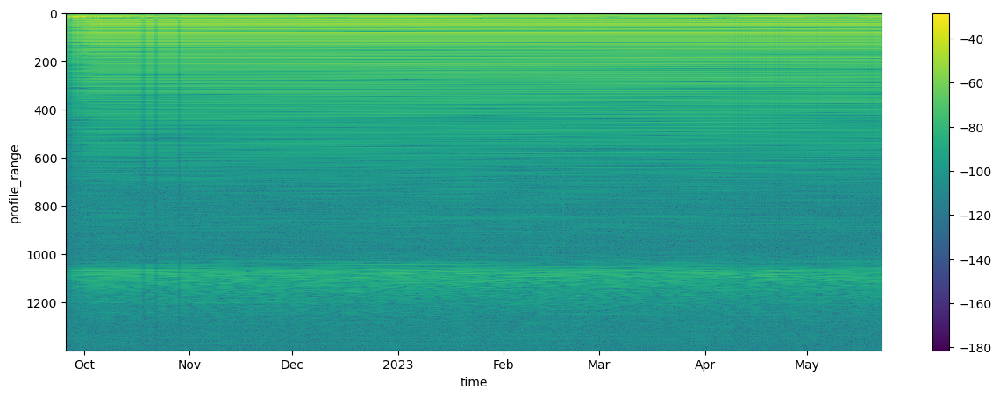

In [15]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(winter).plot(x='time')
ax.invert_yaxis()


(0.0, 600.0)

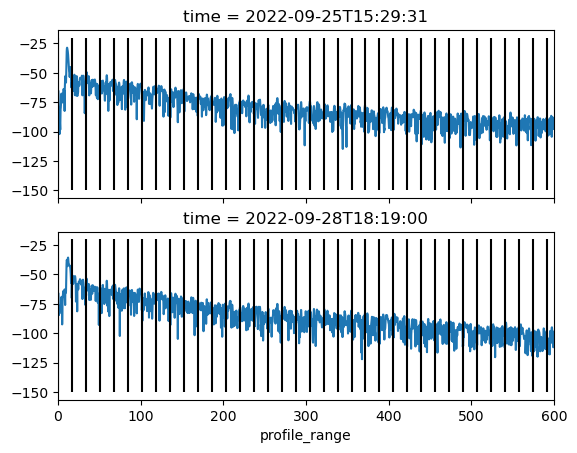

In [95]:
fig, ax = plt.subplots(nrows = 2,sharex=True,sharey=True)
xa.dB(winter.isel(time=0)).plot(ax=ax[0])
ax[0].vlines(winter.profile_range[::80].values,-150,-20,color='k')
ax[0].set_xlabel('')

xa.dB(winter.isel(time=300)).plot(ax=ax[1])
ax[1].vlines(winter.profile_range[::80].values,-150,-20,color='k')
plt.xlim([0,600])
#plt.ylim([-125,-60])

In [107]:
winter.profile_range[::80].where(winter.profile_range[::80] <600,drop=True)

<xarray.DataArray 'profile_range' (profile_range: 36)> Size: 288B
array([  0.        ,  16.90855281,  33.81710563,  50.72565844,
        67.63421126,  84.54276407, 101.45131689, 118.3598697 ,
       135.26842252, 152.17697533, 169.08552814, 185.99408096,
       202.90263377, 219.81118659, 236.7197394 , 253.62829222,
       270.53684503, 287.44539785, 304.35395066, 321.26250348,
       338.17105629, 355.0796091 , 371.98816192, 388.89671473,
       405.80526755, 422.71382036, 439.62237318, 456.53092599,
       473.43947881, 490.34803162, 507.25658443, 524.16513725,
       541.07369006, 557.98224288, 574.89079569, 591.79934851])
Coordinates:
  * profile_range  (profile_range) float64 288B 0.0 16.91 33.82 ... 574.9 591.8

(-125.0, -60.0)

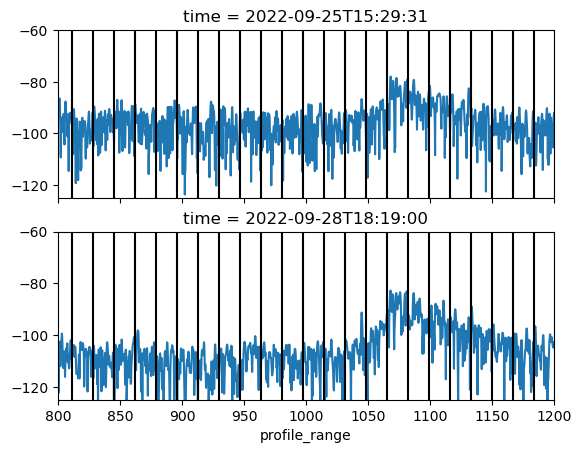

In [87]:
fig, ax = plt.subplots(nrows = 2,sharex=True,sharey=True)
xa.dB(winter.isel(time=0)).plot(ax=ax[0])
ax[0].vlines(winter.profile_range[::80].values,-150,-20,color='k')
ax[0].set_xlabel('')

xa.dB(winter.isel(time=300)).plot(ax=ax[1])
ax[1].vlines(winter.profile_range[::80].values,-150,-20,color='k')
plt.xlim([800,1200])
plt.ylim([-125,-60])

Window 20, lag 1 -> frac high co 0.56, r2 0.03
Window 20, lag 10 -> frac high co 0.55, r2 0.097
Window 20, lag 100 -> frac high co 0.49, r2 0.55
Window 20, lag 1000 -> frac high co 0.34, r2 0.95
Window 40, lag 1 -> frac high co 0.55, r2 0.053
Window 40, lag 10 -> frac high co 0.55, r2 0.15
Window 40, lag 100 -> frac high co 0.48, r2 0.7
Window 40, lag 1000 -> frac high co 0.32, r2 0.97
Window 60, lag 1 -> frac high co 0.55, r2 0.075
Window 60, lag 10 -> frac high co 0.54, r2 0.2
Window 60, lag 100 -> frac high co 0.48, r2 0.77
Window 60, lag 1000 -> frac high co 0.32, r2 0.97
Window 80, lag 1 -> frac high co 0.55, r2 0.093
Window 80, lag 10 -> frac high co 0.55, r2 0.24
Window 80, lag 100 -> frac high co 0.48, r2 0.83
Window 80, lag 1000 -> frac high co 0.33, r2 0.98
Best window: 80, best lag: 100


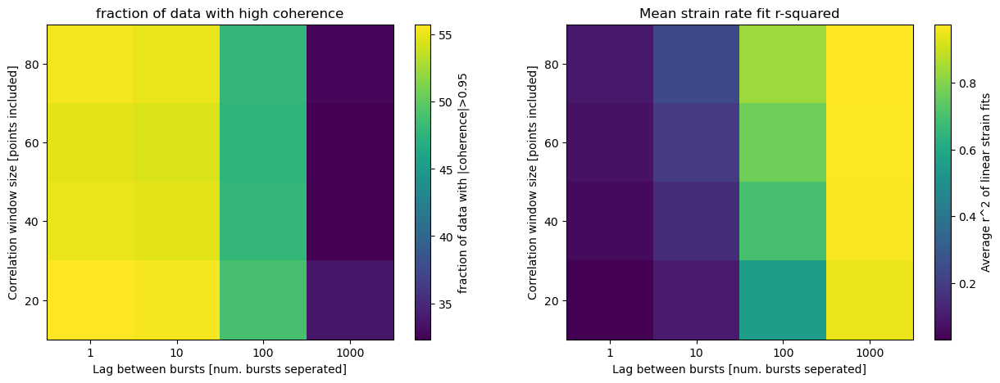

In [19]:
best_window,best_lag,res = optimal_window_and_leapfrog(winter,600)
print(f'Best window: {best_window}, best lag: {best_lag}')

In [88]:
mean,r2,res = strain_metrics(winter, 80, 80,200,600)

In [89]:
fit = res[2]
vvs = res[0]
slope = fit.polyfit_coefficients.sel(degree=1)*vvs.profile_range+fit.polyfit_coefficients.sel(degree=0)
residual = vvs-slope

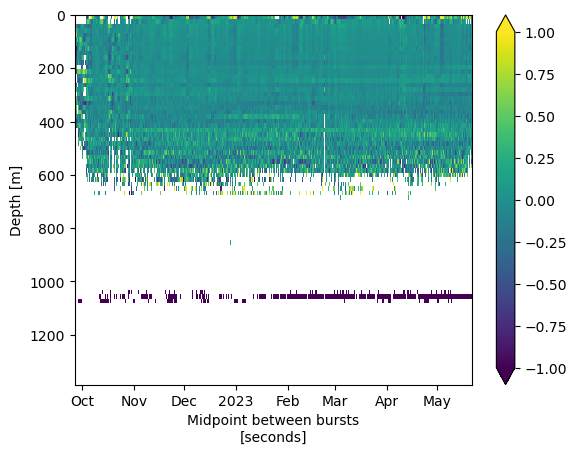

In [90]:
residual.plot(x='time',vmin=-1,vmax=1)
plt.gca().invert_yaxis()

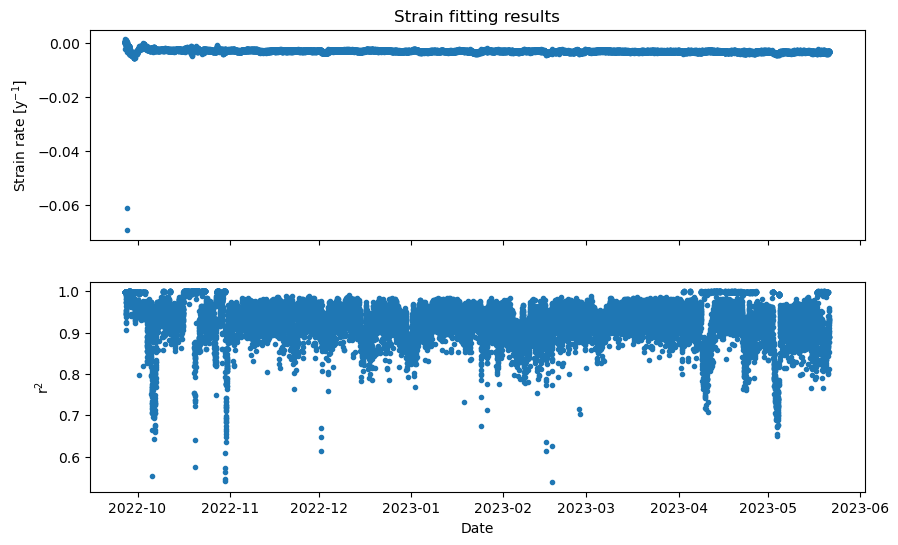

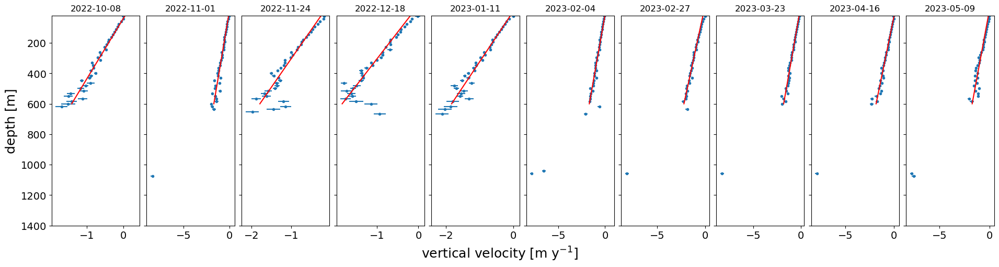

In [91]:
plot_strain_fit(res)

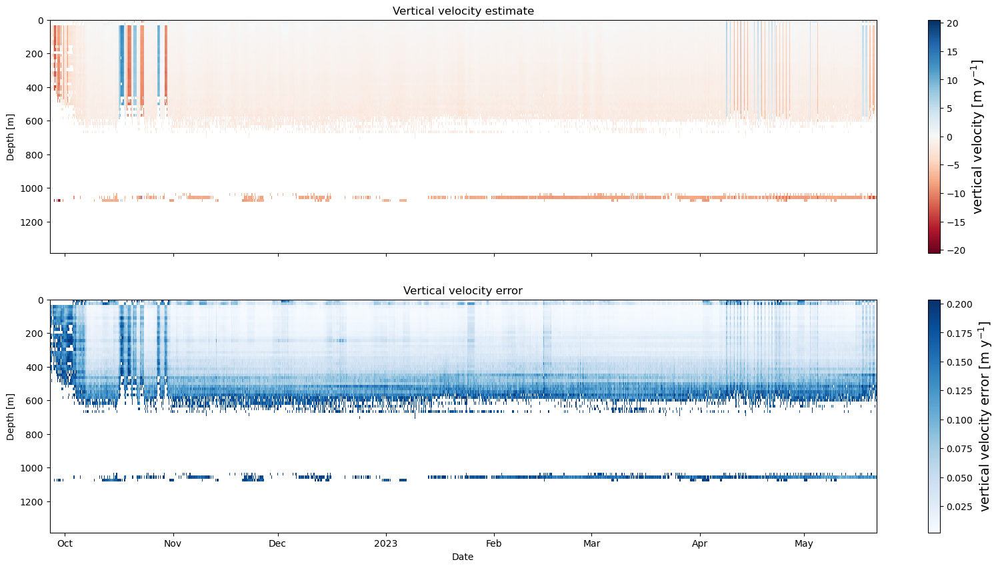

In [92]:
plot_vv_2d(res)

Now we try interpolating

In [12]:
winter

<xarray.DataArray (time: 22956, profile_range: 6624)> Size: 2GB
array([[ 5.06326745e-04+0.00000000e+00j,  3.29652345e-04-4.41765834e-04j,
        -2.85269208e-04-4.69567252e-04j, ...,
         2.59091039e-06+2.74819229e-06j, -3.86808919e-07+1.76036018e-06j,
         4.06005780e-06+4.23522656e-06j],
       [ 2.41813205e-04+0.00000000e+00j,  2.85586226e-04-2.11483820e-04j,
        -1.34732389e-04-4.10739250e-04j, ...,
         6.37678124e-06+4.59783702e-06j,  5.83369213e-06-6.27687758e-06j,
        -5.74777697e-06-7.04314398e-06j],
       [ 5.63542959e-04+0.00000000e+00j,  3.97401610e-04-5.05267955e-04j,
        -3.59895337e-04-5.69897613e-04j, ...,
         3.99936545e-06-1.02301003e-06j, -1.01973391e-06-4.16721080e-06j,
        -3.65569830e-06+1.14141769e-07j],
       ...,
       [-2.52830692e-04+0.00000000e+00j, -2.22356294e-04+2.22162076e-04j,
         1.46271159e-04+3.20154799e-04j, ...,
         1.74550986e-07-3.04470798e-06j, -2.32928969e-06-1.65375150e-06j,
        -1.41488577e-06+3.85705599e-07j],
       [-2.52643315e-04+0.00000000e+00j, -2.23196747e-04+2.21980005e-04j,
         1.46094405e-04+3.21380450e-04j, ...,
        -1.74496753e-06-1.12064340e-06j, -1.67096187e-06-7.27462746e-07j,
        -2.36494060e-06+5.68358739e-07j],
       [-2.46590866e-04+0.00000000e+00j, -2.28700024e-04+2.16696636e-04j,
         1.42617047e-04+3.29187954e-04j, ...,
         3.42274525e-07+9.62267005e-08j,  1.01785805e-06-1.15703979e-06j,
        -8.09500524e-07-1.93945468e-06j]])
Coordinates:
  * profile_range  (profile_range) float64 53kB 0.0 0.2114 ... 1.4e+03 1.4e+03
  * time           (time) datetime64[ns] 184kB 2022-09-25T15:29:31 ... 2023-0...
Attributes:
    centre_freq:  300495000.0

In [13]:
time_to_interp = pd.date_range("2022-09-25 16:00", "2023-05-22 12:00", freq="15min")
interp_profiles = winter.interp(time=time_to_interp,method='linear')

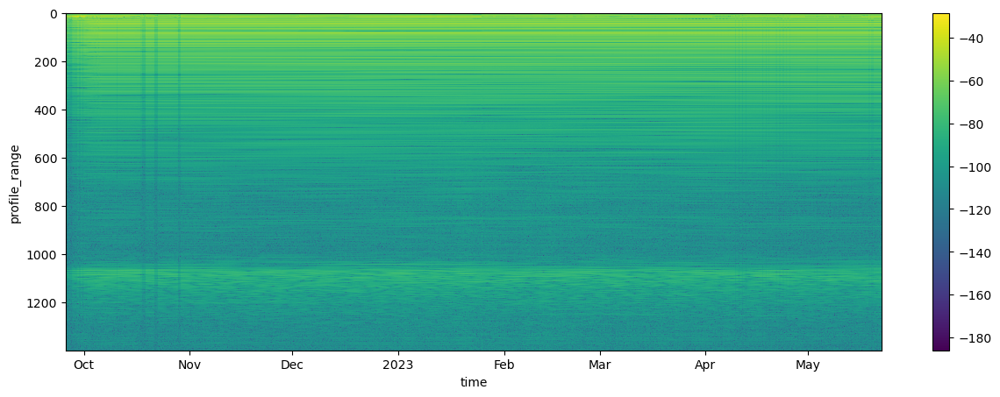

In [14]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(interp_profiles).plot(x='time')
ax.invert_yaxis()


Window 20, lag 1 -> mean 1.0, r2 0.033
Window 20, lag 10 -> mean 1.0, r2 0.11
Window 20, lag 100 -> mean 0.99, r2 0.61
Window 20, lag 1000 -> mean 0.97, r2 0.95
Window 40, lag 1 -> mean 1.0, r2 0.056
Window 40, lag 10 -> mean 1.0, r2 0.17
Window 40, lag 100 -> mean 0.99, r2 0.75
Window 40, lag 1000 -> mean 0.97, r2 0.97
Window 60, lag 1 -> mean 1.0, r2 0.079
Window 60, lag 10 -> mean 1.0, r2 0.23
Window 60, lag 100 -> mean 0.99, r2 0.81
Window 60, lag 1000 -> mean 0.97, r2 0.97
Window 80, lag 1 -> mean 1.0, r2 0.099
Window 80, lag 10 -> mean 1.0, r2 0.28
Window 80, lag 100 -> mean 0.99, r2 0.87
Window 80, lag 1000 -> mean 0.97, r2 0.98
Best window: 80, best lag: 1000


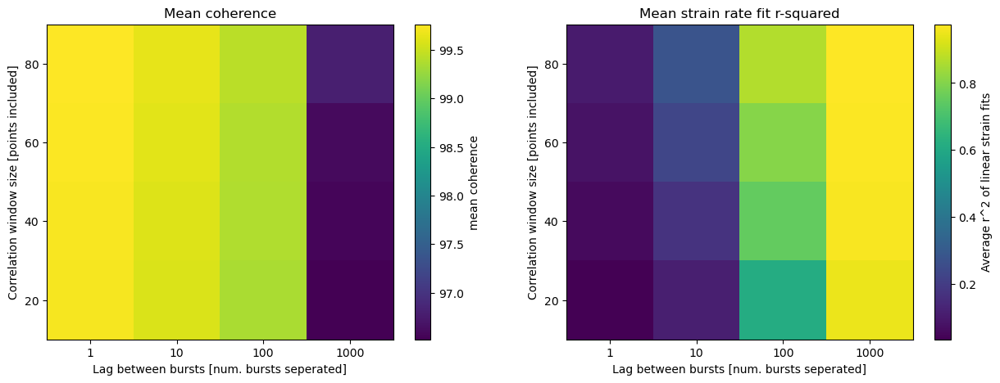

In [15]:
best_window,best_lag,res = optimal_window_and_leapfrog(interp_profiles,600)
print(f'Best window: {best_window}, best lag: {best_lag}')

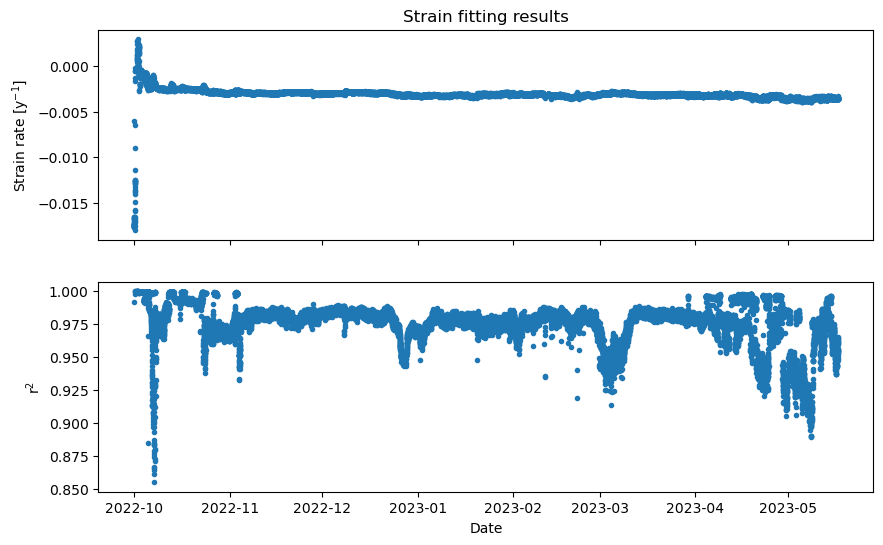

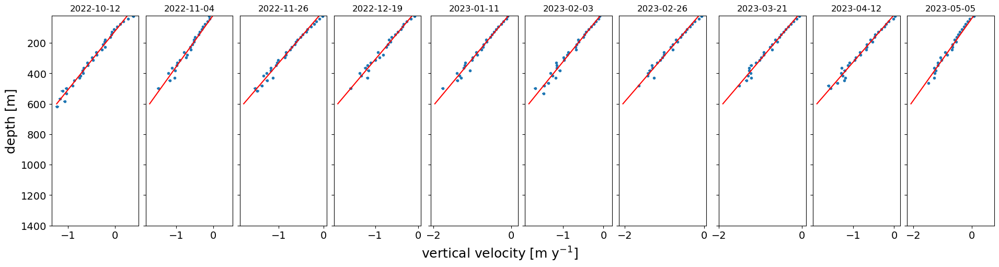

In [16]:
plot_strain_fit(res)

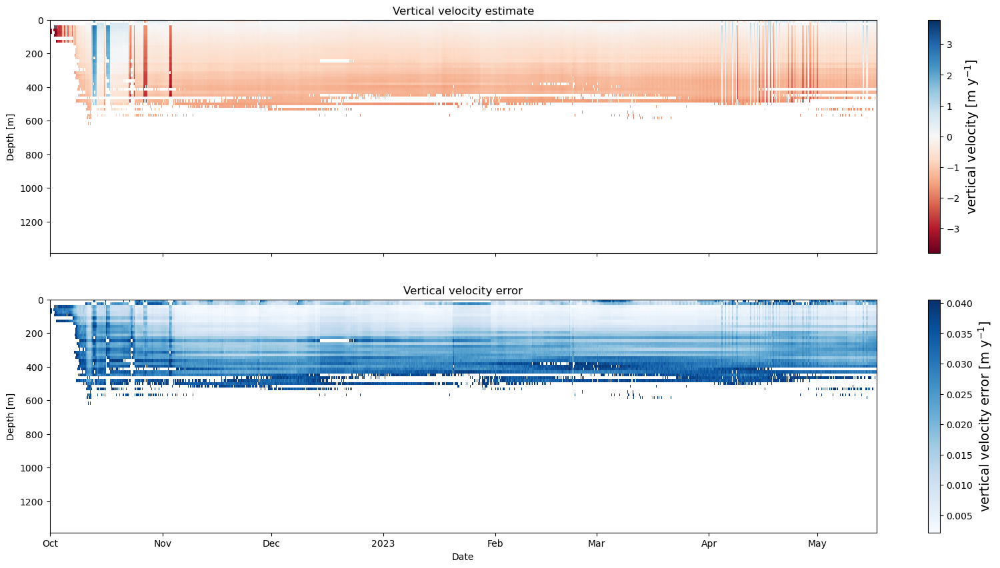

In [17]:
plot_vv_2d(res)

Test alternative settings

In [25]:
mean,r2,res = strain_metrics(interp_profiles, 80, 80,100,600)

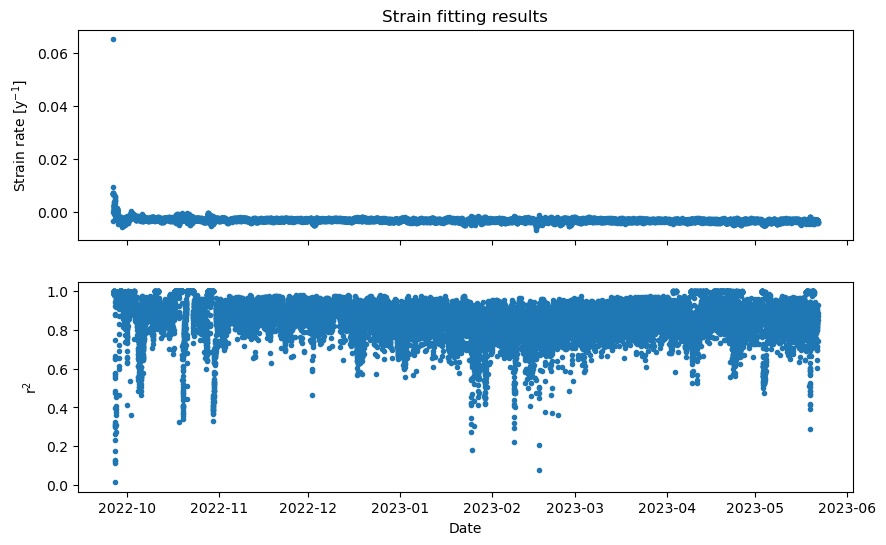

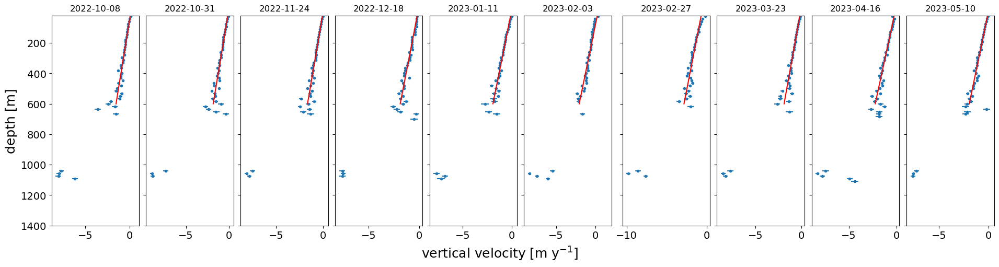

In [26]:
plot_strain_fit(res)

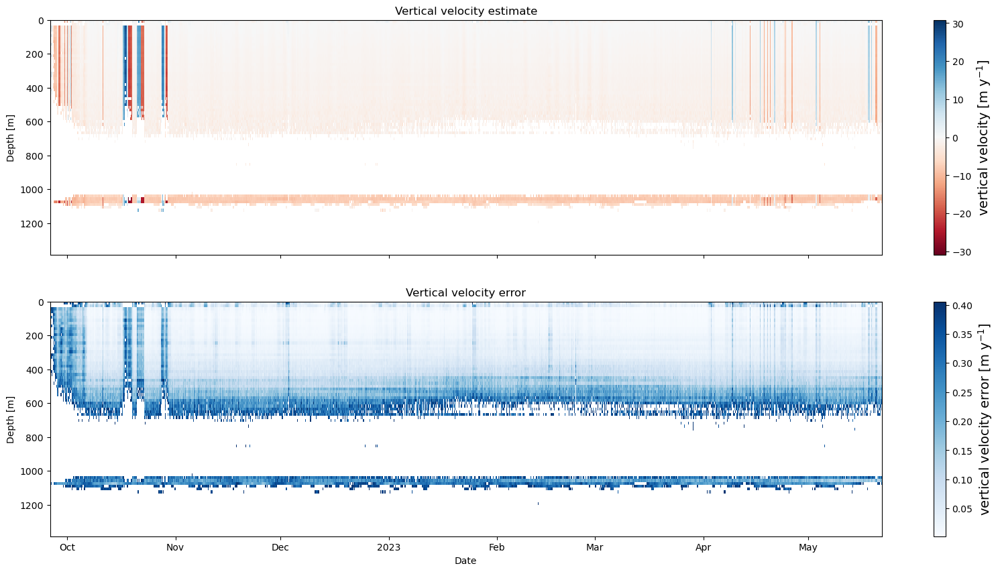

In [27]:
plot_vv_2d(res)

In [28]:
mean,r2,res = strain_metrics(interp_profiles, 40, 40,1000,600)

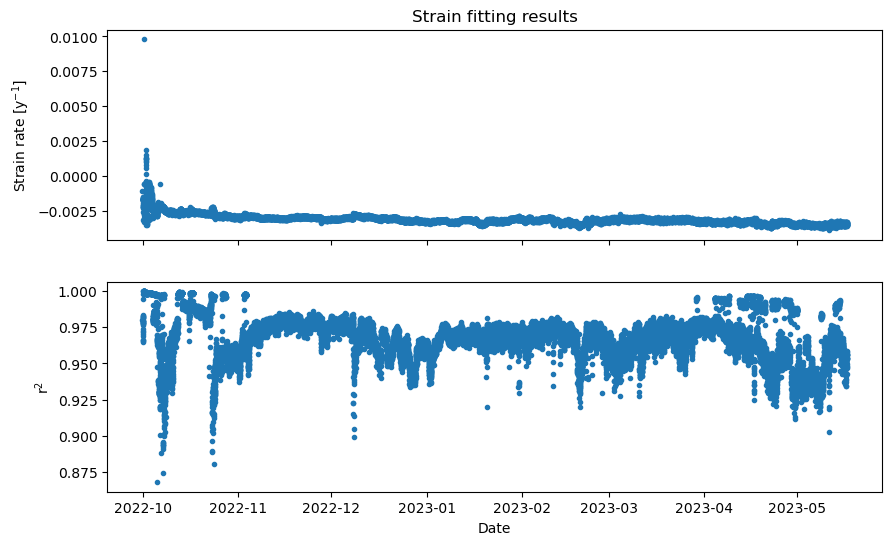

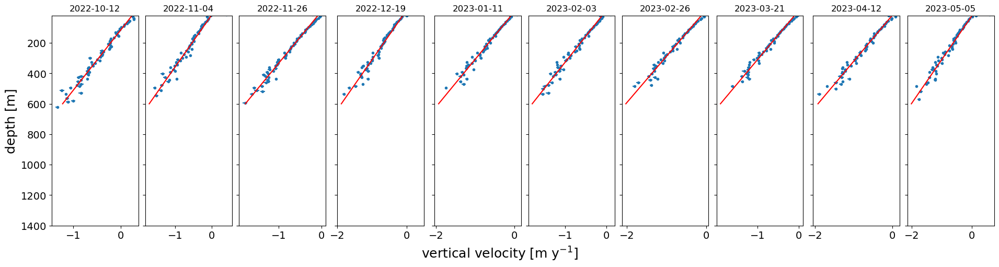

In [29]:
plot_strain_fit(res)

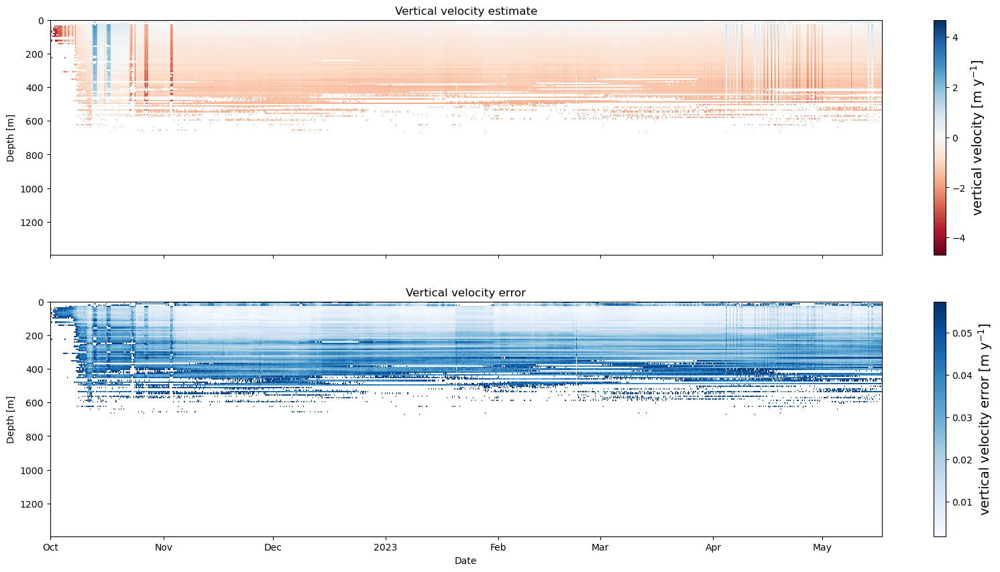

In [30]:
plot_vv_2d(res)

Test with half waveform

In [18]:
winter = custom_profile(ds_101_w.isel(attenuator_setting_pair=0).chirp,clip_threshold=1.2,min_chirps = 5,start=20000)

In [19]:
winter.profile_range

<xarray.DataArray 'profile_range' (profile_range: 3329)> Size: 27kB
array([0.000000e+00, 4.206212e-01, 8.412424e-01, ..., 1.398986e+03,
       1.399407e+03, 1.399827e+03])
Coordinates:
  * profile_range  (profile_range) float64 27kB 0.0 0.4206 ... 1.399e+03 1.4e+03

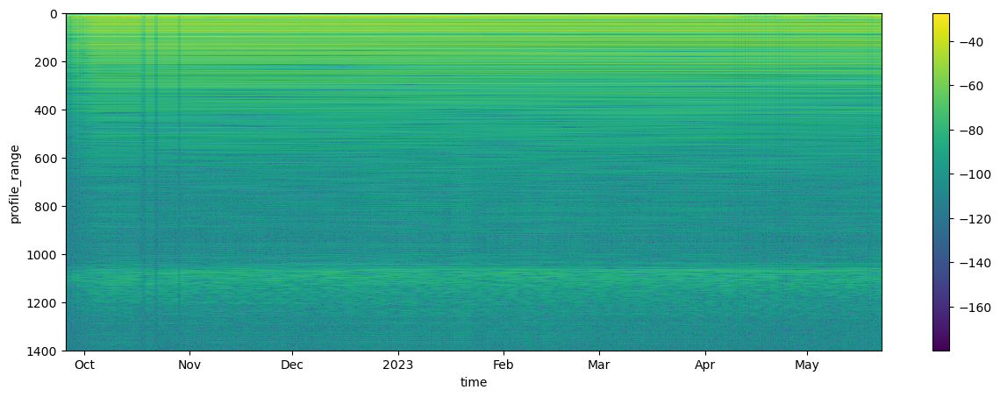

In [20]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(winter).plot(x='time')
ax.invert_yaxis()


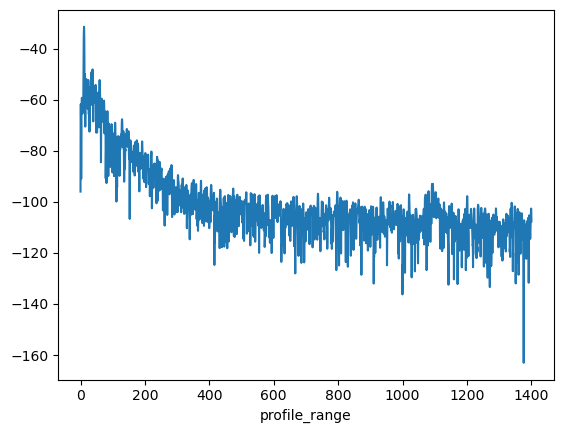

In [21]:
xa.dB(winter.mean(dim='time')).plot()


Window 20, lag 1 -> mean 0.99, r2 0.056
Window 20, lag 10 -> mean 0.99, r2 0.12
Window 20, lag 100 -> mean 0.99, r2 0.51
Window 20, lag 1000 -> mean 0.94, r2 0.93
Window 40, lag 1 -> mean 0.99, r2 0.1
Window 40, lag 10 -> mean 0.99, r2 0.19
Window 40, lag 100 -> mean 0.99, r2 0.65
Window 40, lag 1000 -> mean 0.94, r2 0.95
Window 60, lag 1 -> mean 0.99, r2 0.14
Window 60, lag 10 -> mean 0.99, r2 0.25
Window 60, lag 100 -> mean 0.99, r2 0.73
Window 60, lag 1000 -> mean 0.94, r2 0.96
Window 80, lag 1 -> mean 0.99, r2 0.18
Window 80, lag 10 -> mean 0.99, r2 0.3
Window 80, lag 100 -> mean 0.99, r2 0.77
Window 80, lag 1000 -> mean 0.94, r2 0.96
Best window: 80, best lag: 1000


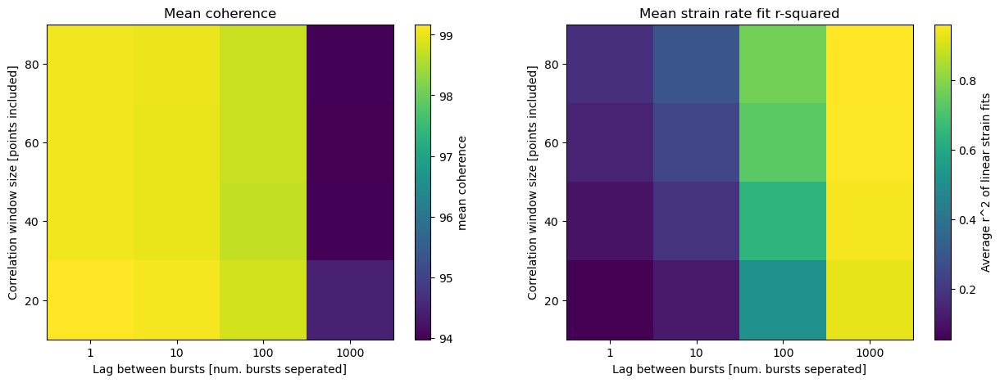

In [22]:
best_window,best_lag,res = optimal_window_and_leapfrog(winter,600)
print(f'Best window: {best_window}, best lag: {best_lag}')

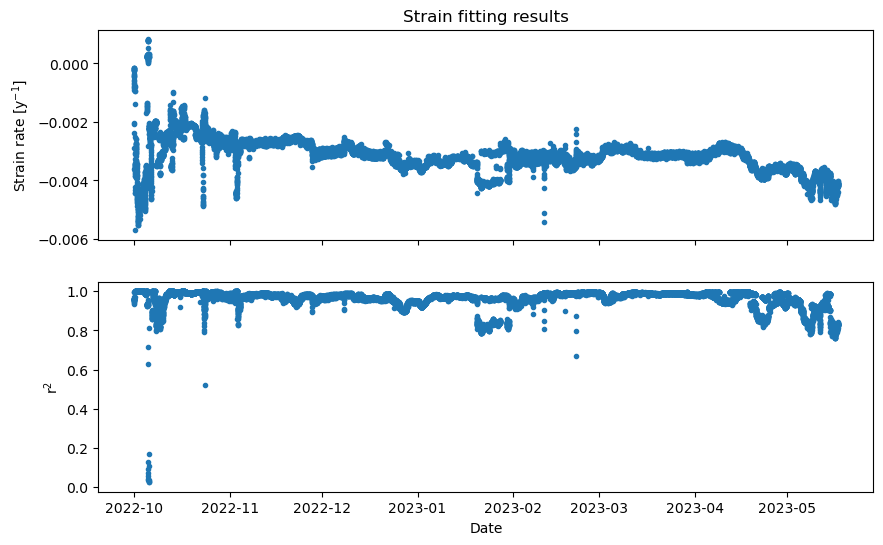

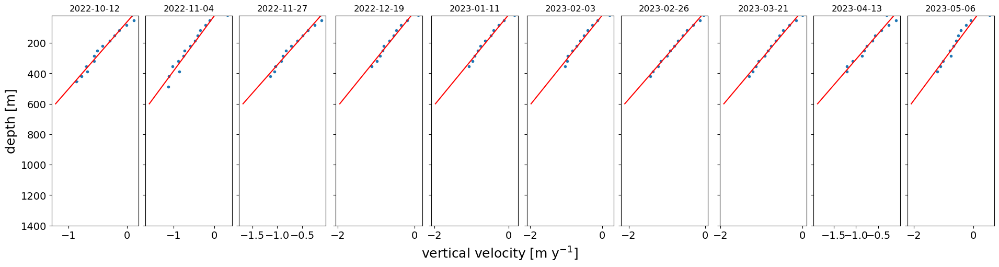

In [23]:
plot_strain_fit(res)

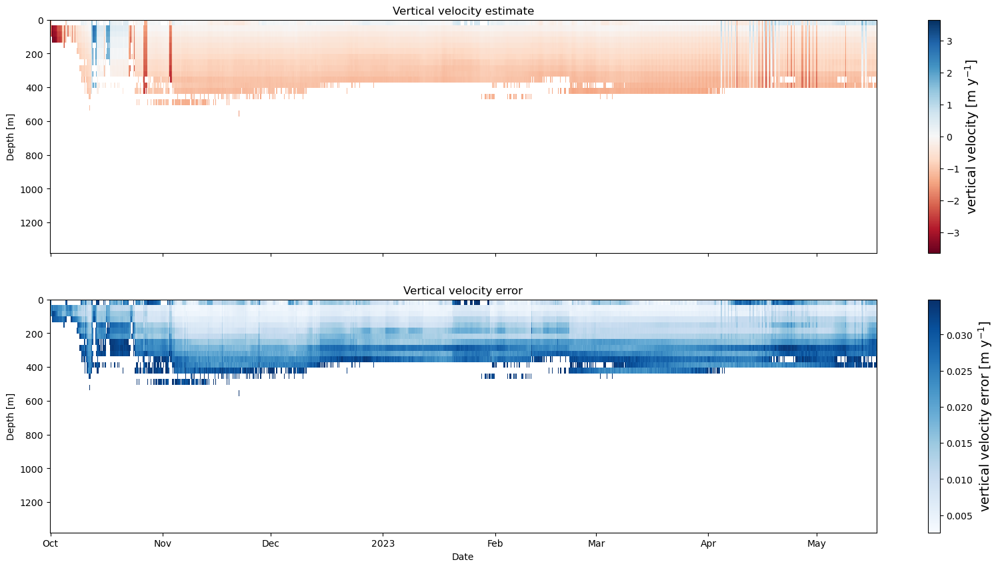

In [24]:
plot_vv_2d(res)

# New methodology example with A11 winter

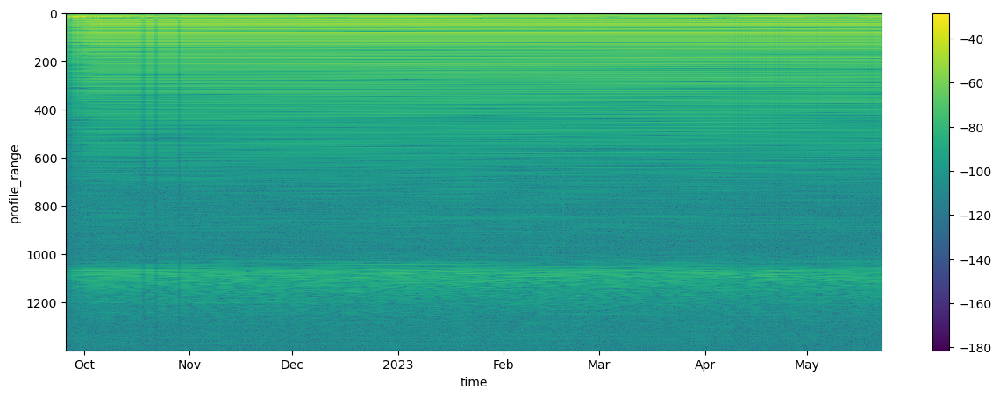

In [100]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(winter).plot(x='time')
ax.invert_yaxis()
#import datetime
#xlim=[datetime.date(2022, 12, 1), datetime.date(2023, 4, 1)]
#plt.xlim(xlim)

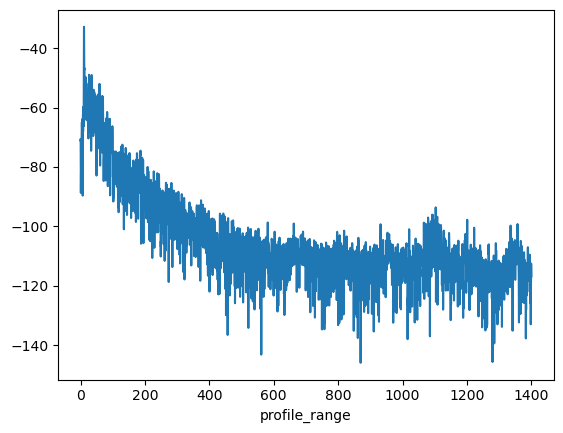

In [5]:
xa.dB(winter.mean(dim='time')).plot()


In [6]:
noise_floor_location = 600
for i in [20,30,40,60,70,80]:
    co_bins = winter.profile_range[::i].where(winter.profile_range[::i] <noise_floor_location,drop=True)
    print(f'Bin size of {i} points leads to a total of {len(co_bins)} points in the first {noise_floor_location} m')

Bin size of 20 points leads to a total of 142 points in the first 600 m
Bin size of 30 points leads to a total of 95 points in the first 600 m
Bin size of 40 points leads to a total of 71 points in the first 600 m
Bin size of 60 points leads to a total of 48 points in the first 600 m
Bin size of 70 points leads to a total of 41 points in the first 600 m
Bin size of 80 points leads to a total of 36 points in the first 600 m


Looks like 70 is the best window for the winter. Now for the time lag, we interpolate so we have consistent times.

In [78]:
b1 = winter.isel(time=[1000])
b2 = winter.isel(time=[1200])
dz, co, phi = xa.generate_range_diff(b1,b2,70,70,None,0,0.95)

In [79]:
dz

<xarray.Dataset> Size: 2kB
Dimensions:        (time: 1, profile_range: 94)
Coordinates:
  * time           (time) datetime64[ns] 8B 2022-10-07T02:19:25
  * profile_range  (profile_range) float64 752B 7.397 22.19 ... 1.383e+03
Data variables:
    time_diff      (time) float64 8B 1.8e+05
    range_diff     (time, profile_range) float64 752B 0.002401 ... -0.01003
    err            (time, profile_range) float64 752B 0.0008116 ... 0.007076

(1000.0, 1200.0)

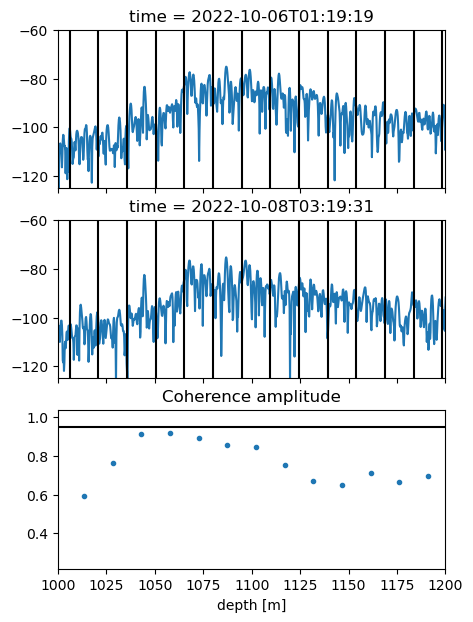

In [80]:
fig, ax = plt.subplots(figsize=(5,7),nrows = 3,sharex=True)
xa.dB(winter.isel(time=1000)).plot(ax=ax[0])
ax[0].vlines(winter.profile_range[::70].values,-150,-20,color='k')
ax[0].set_xlabel('')
ax[0].set_ylim([-125,-60])


xa.dB(winter.isel(time=1200)).plot(ax=ax[1])
ax[1].vlines(winter.profile_range[::70].values,-150,-20,color='k')
ax[1].set_xlabel('')
ax[1].set_ylim([-125,-60])

ax[2].plot(dz.profile_range.values,abs(co.T),linestyle='None',marker='.')
ax[2].axhline(y=0.95,color = 'k')
ax[2].set_xlabel('depth [m]')
ax[2].set_title('Coherence amplitude')
plt.xlim([1000,1200])


In [83]:
time_to_interp = pd.date_range("2022-09-25 16:00", "2023-05-22 12:00", freq="15min")
interp_profiles = winter.interp(time=time_to_interp,method='linear')

Now we pick an optimal time lag. We do this by increasing it until we cannot see any bed estimate anymore, since that is the most evolving signal

In [8]:
time_lags = [2,4,8,24,48,96,192,288,672,1344] # 30 mins, 1,2,6,12 hours, 1,2,3 days, 1,2 weeks

Lag 2 -> frac high co 0.58, r2 0.1
Lag 4 -> frac high co 0.58, r2 0.14
Lag 8 -> frac high co 0.58, r2 0.21
Lag 24 -> frac high co 0.57, r2 0.46
Lag 48 -> frac high co 0.55, r2 0.67
Lag 96 -> frac high co 0.5, r2 0.83
Lag 192 -> frac high co 0.47, r2 0.93
Lag 288 -> frac high co 0.45, r2 0.95
Lag 672 -> frac high co 0.39, r2 0.97
Lag 1344 -> frac high co 0.28, r2 0.97


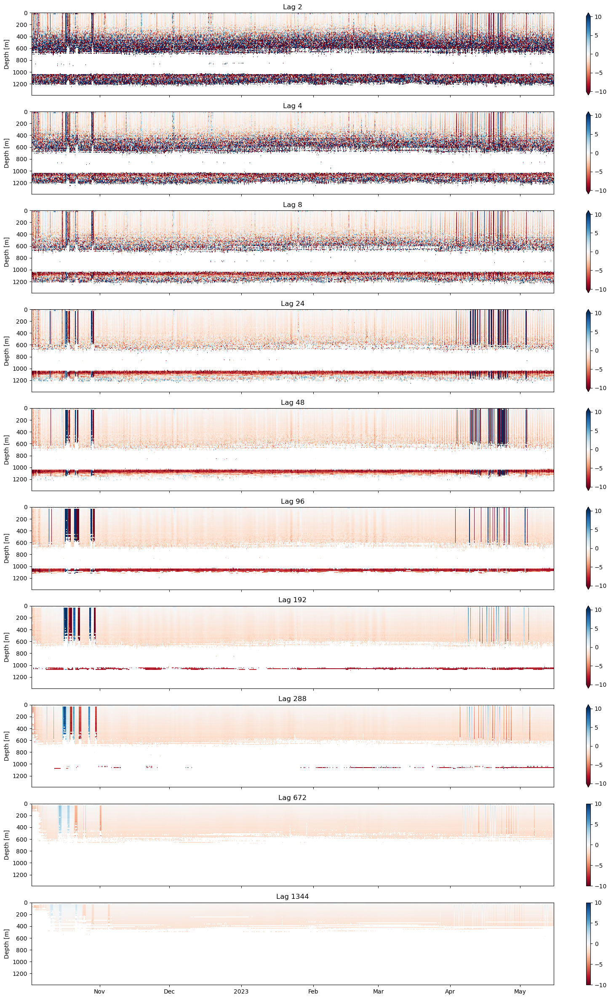

In [12]:
fig, axs = plt.subplots(figsize=(20,30),nrows=10,sharex=True)

for i in range(len(time_lags)):
    count,r2,res = strain_metrics(interp_profiles, 70, 70,time_lags[i],noise_floor_location)
    print(f"Lag {time_lags[i]} -> frac high co {count:.2}, r2 {r2:.2}")
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    plt1 = vv.plot(ax=axs[i],x='time',cmap='RdBu',vmin=-10,vmax=10)
    axs[i].invert_yaxis()
    axs[i].set_xlabel('')
    axs[i].set_title(f"Lag {time_lags[i]}")
    #plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

Looks like a daily vertical velocity works best

In [84]:
count,r2,res = strain_metrics(interp_profiles, 70, 70,96,noise_floor_location)

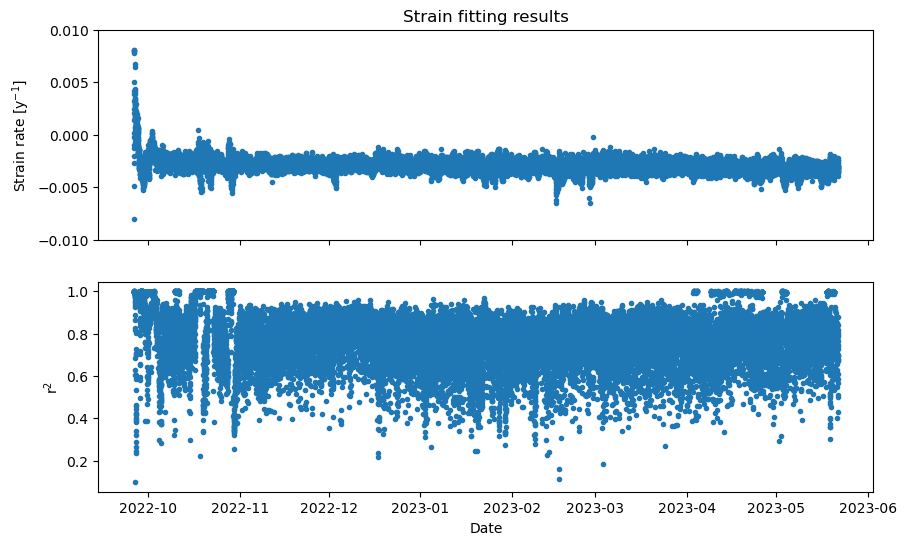

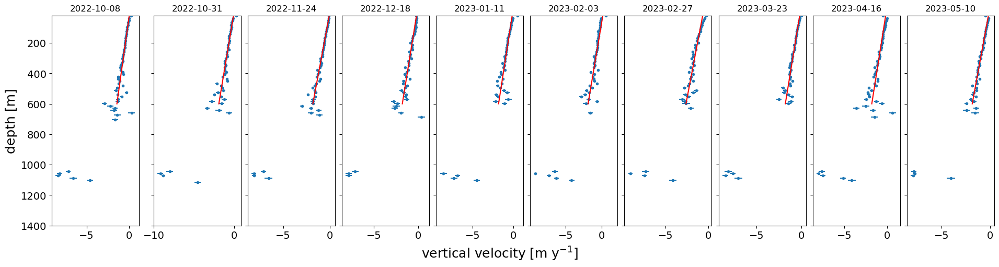

In [98]:
plot_strain_fit(res,None,[-0.01,0.01])

In [ ]:
#import datetime
#xlim=[datetime.date(2022, 12, 1), datetime.date(2023, 4, 1)]
plot_vv_2d(res,xlim)

Experiment. Normalize the profiles by their mean amplitude at each time step.


In [25]:
normalized_profiles = interp_profiles/(interp_profiles.mean(dim='profile_range'))

In [26]:
normalized_profiles.attrs = interp_profiles.attrs

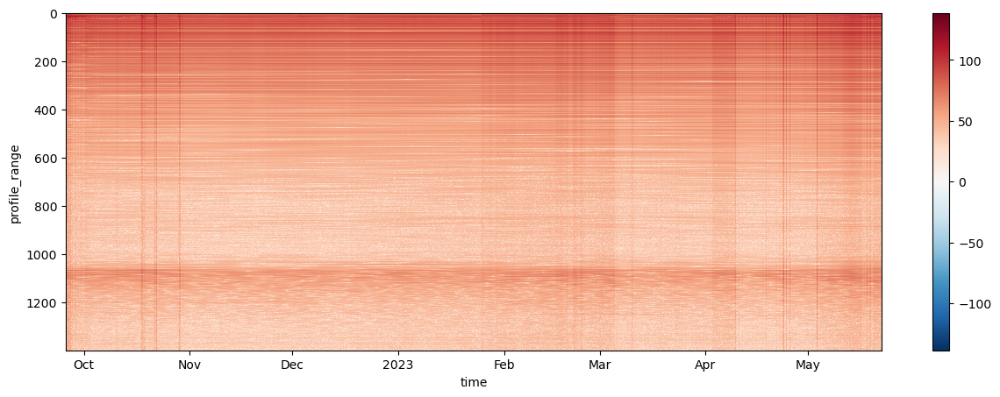

In [27]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(normalized_profiles).plot(x='time')
ax.invert_yaxis()


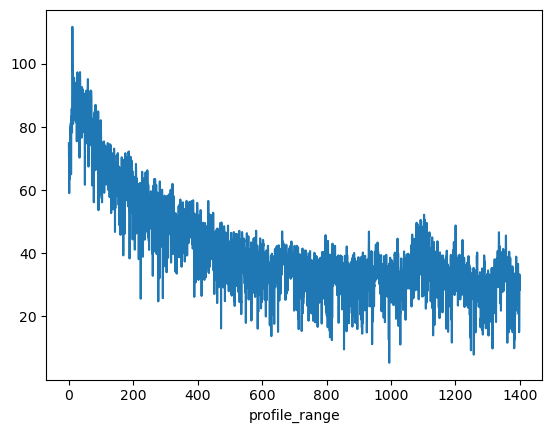

In [28]:
xa.dB(normalized_profiles.mean(dim='time')).plot()


Lag 2 -> frac high co 0.58, r2 0.45
Lag 4 -> frac high co 0.58, r2 0.48
Lag 8 -> frac high co 0.58, r2 0.54
Lag 24 -> frac high co 0.57, r2 0.69
Lag 48 -> frac high co 0.55, r2 0.81
Lag 96 -> frac high co 0.5, r2 0.91
Lag 192 -> frac high co 0.47, r2 0.95
Lag 288 -> frac high co 0.45, r2 0.97
Lag 672 -> frac high co 0.39, r2 0.98
Lag 1344 -> frac high co 0.28, r2 0.98


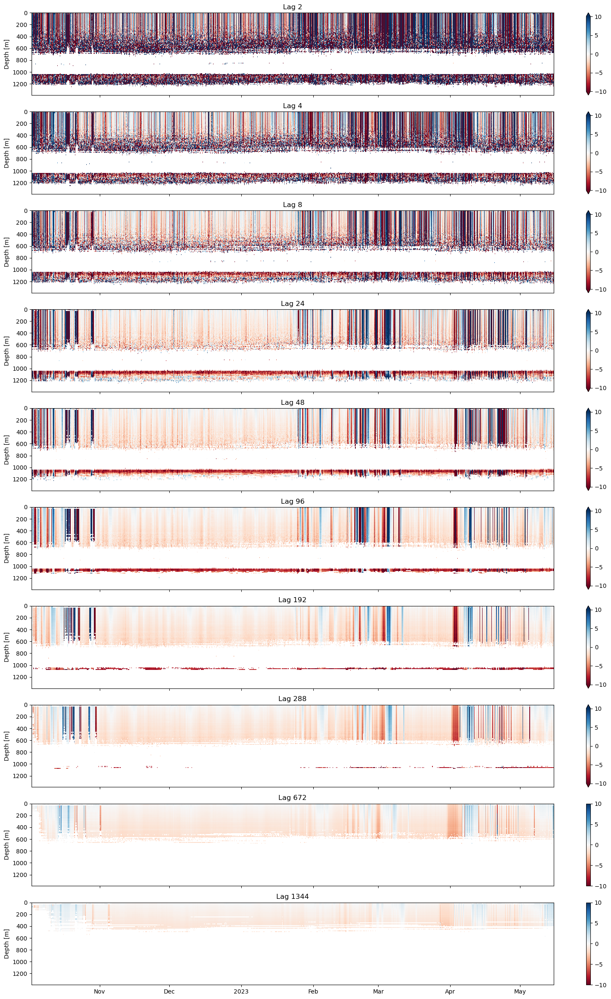

In [29]:
fig, axs = plt.subplots(figsize=(20,30),nrows=10,sharex=True)

for i in range(len(time_lags)):
    count,r2,res = strain_metrics(normalized_profiles, 70, 70,time_lags[i],noise_floor_location)
    print(f"Lag {time_lags[i]} -> frac high co {count:.2}, r2 {r2:.2}")
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    plt1 = vv.plot(ax=axs[i],x='time',cmap='RdBu',vmin=-10,vmax=10)
    axs[i].invert_yaxis()
    axs[i].set_xlabel('')
    axs[i].set_title(f"Lag {time_lags[i]}")
    #plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

Seems like normalizing by either mean profile or mean amplitude of profile doesnt do anything.

## Trying new method with A11 Summer

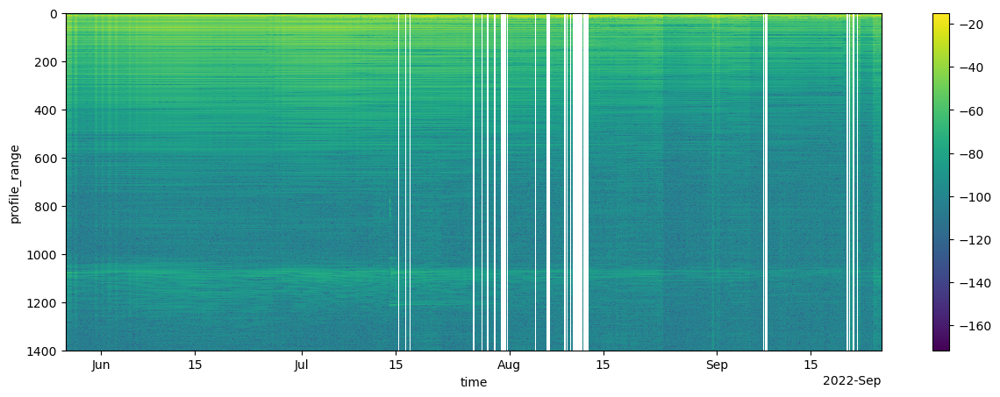

In [33]:
fig, ax = plt.subplots(figsize=(15,5))
xa.dB(s22).plot(x='time')
ax.invert_yaxis()


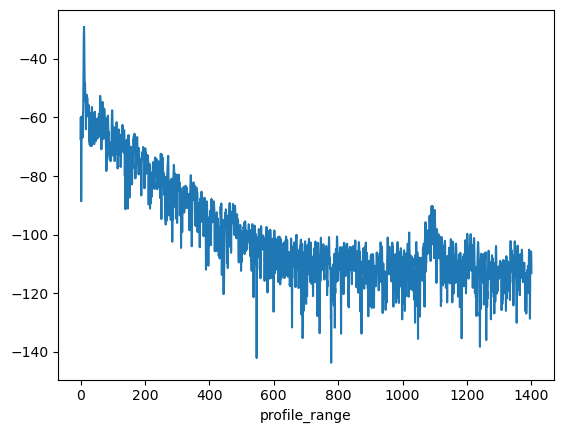

In [35]:
xa.dB(s22.mean(dim='time')).plot()


In [40]:
noise_floor_location = 700
for i in [20,30,40,60,70,80]:
    co_bins = s22.profile_range[::i].where(s22.profile_range[::i] <noise_floor_location,drop=True)
    print(f'Bin size of {i} points leads to a total of {len(co_bins)} points in the first {noise_floor_location} m')

Bin size of 20 points leads to a total of 84 points in the first 700 m
Bin size of 30 points leads to a total of 56 points in the first 700 m
Bin size of 40 points leads to a total of 42 points in the first 700 m
Bin size of 60 points leads to a total of 28 points in the first 700 m
Bin size of 70 points leads to a total of 24 points in the first 700 m
Bin size of 80 points leads to a total of 21 points in the first 700 m


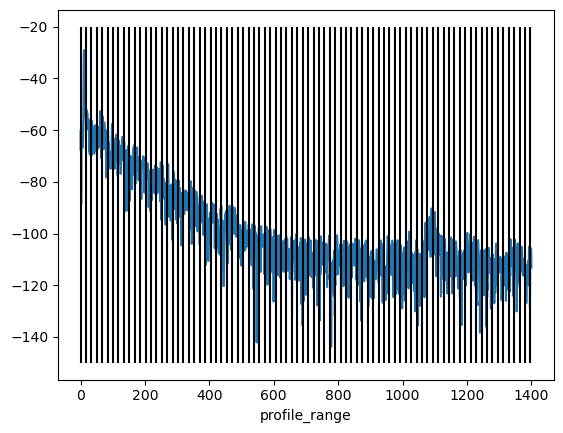

In [45]:
xa.dB(s22.mean(dim='time')).plot()
plt.vlines(s22.profile_range[::40].values,-150,-20,color='k')


40 seems to be the best choice here

In [41]:
time_to_interp = pd.date_range("2022-05-27 12:00", "2022-09-25 12:00", freq="15min")
interp_profiles = s22.interp(time=time_to_interp,method='linear')

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 2 -> frac high co 0.48, r2 0.24


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 4 -> frac high co 0.46, r2 0.34


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 8 -> frac high co 0.44, r2 0.47


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 24 -> frac high co 0.38, r2 0.67


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 48 -> frac high co 0.33, r2 0.75


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 96 -> frac high co 0.3, r2 0.84


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 192 -> frac high co 0.22, r2 0.9


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 288 -> frac high co 0.17, r2 0.93


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 672 -> frac high co 0.085, r2 0.94


/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


Lag 1344 -> frac high co 0.038, r2 0.95


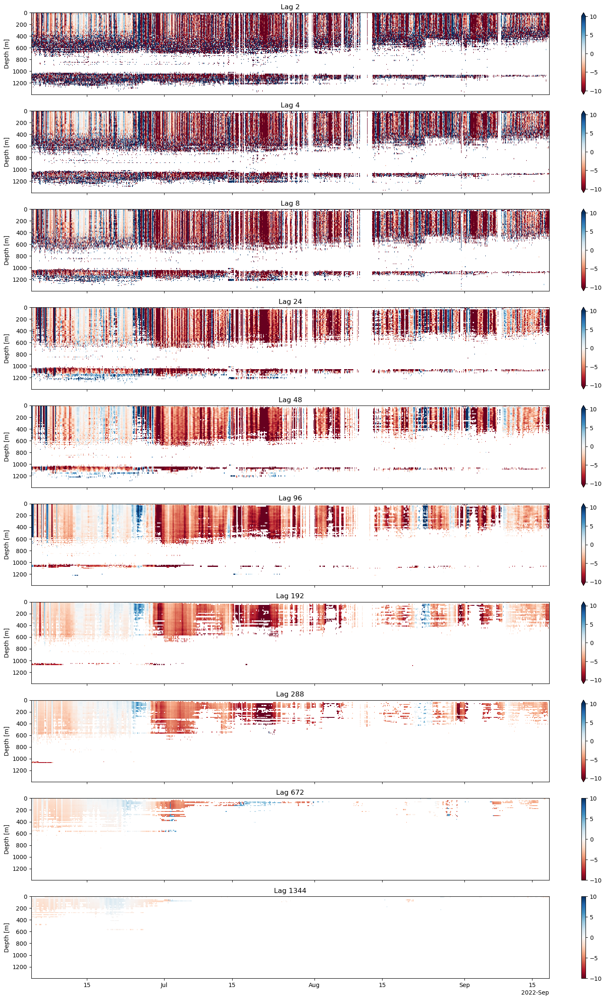

In [42]:
fig, axs = plt.subplots(figsize=(20,30),nrows=10,sharex=True)

for i in range(len(time_lags)):
    count,r2,res = strain_metrics(interp_profiles, 40, 40,time_lags[i],noise_floor_location)
    print(f"Lag {time_lags[i]} -> frac high co {count:.2}, r2 {r2:.2}")
    vv = res[0]
    vv_err = res[1]
    fit=res[2]
    r2 = res[3]
    plt1 = vv.plot(ax=axs[i],x='time',cmap='RdBu',vmin=-10,vmax=10)
    axs[i].invert_yaxis()
    axs[i].set_xlabel('')
    axs[i].set_title(f"Lag {time_lags[i]}")
    #plt1.colorbar.set_label(label='vertical velocity [m y$^{-1}$]', size=14)

In [46]:
count,r2,res = strain_metrics(interp_profiles, 40, 40,96,noise_floor_location)

/home/jovyan/xapres_package/notebooks/test_notes/strain_rates/../../../xapres_package/ApRESDefs.py:654: RuntimeWarning: invalid value encountered in divide
  c = top/bottom


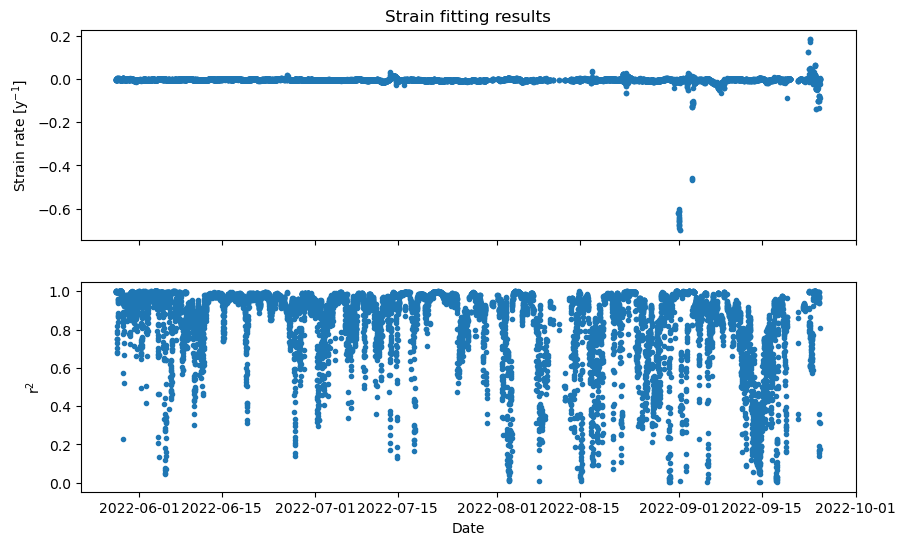

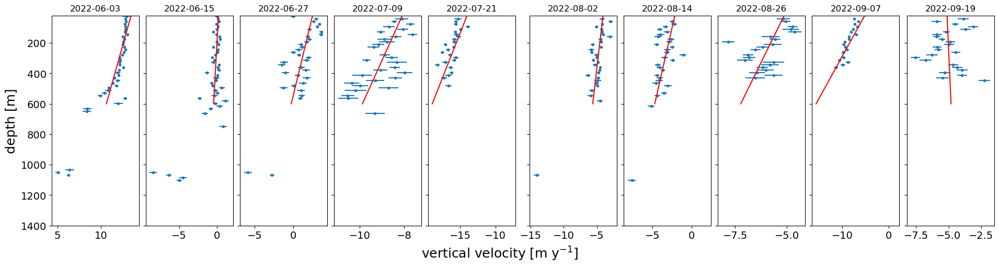

In [47]:
plot_strain_fit(res)

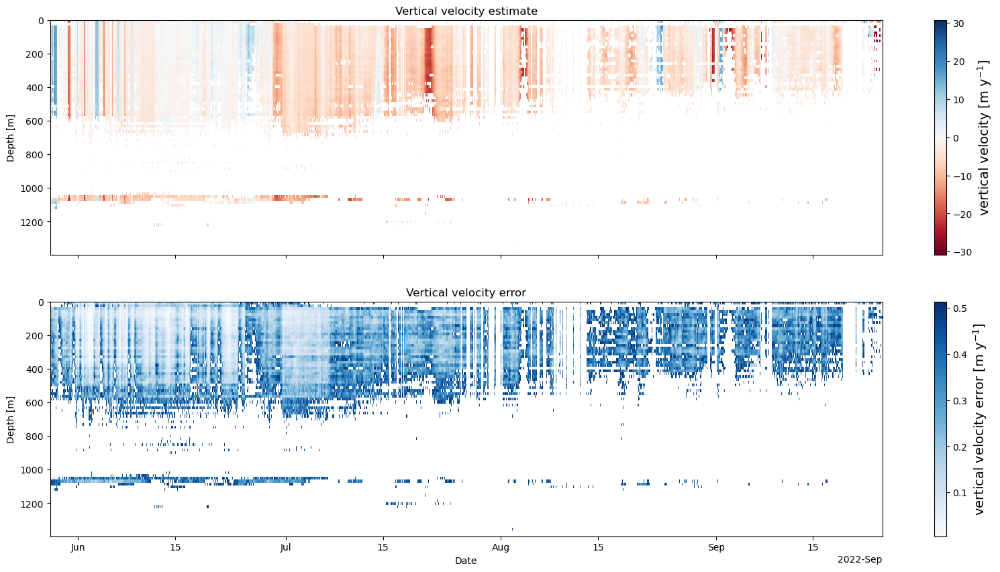

In [48]:
plot_vv_2d(res)